# GRID — KMA wind pipeline (seapoint PCA)

PCA → MDA → KMA on GRID WHACS seapoints, export cluster winds, and build `CASES_ONLY_WIND` with dynamic-style `griddata` onto the SWAN INPGRID.


In [1]:
import importlib
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

_nb = globals().get("__vsc_ipynb_file__")
_start = Path(_nb).resolve().parent if _nb else Path.cwd().resolve()
REPO_ROOT = next(
    p for p in (_start, *_start.parents)
    if (p / "01_BinWaves").is_dir() and (p / "02_Wind_Metamodel").is_dir()
)
GRID_DIR = REPO_ROOT / "02_Wind_Metamodel" / "grid1"
CASES_ROOT = GRID_DIR / "inputs/CASES_ONLY_WIND"
OUT_KMA = GRID_DIR / "outputs/KMA"
OUT_FIG = GRID_DIR / "outputs/Figures"

for p in (OUT_KMA, OUT_FIG):
    p.mkdir(parents=True, exist_ok=True)

UTILS_DIR = GRID_DIR / "utils"
if str(UTILS_DIR) not in sys.path:
    sys.path.insert(0, str(UTILS_DIR))

import whacs_wind
importlib.reload(whacs_wind)

print("GRID root:", GRID_DIR)
print("Repo root:", REPO_ROOT)
print("whacs_wind:", whacs_wind.__file__)


GRID root: /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1
whacs_wind: /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1/utils/whacs_wind.py


## 1. Load WHACS seapoints

Use the grid1 WHACS files as-is (`north_carolina_winds_*_WHACS.nc`). Only restrict to valid years (1980+) before PCA.


In [2]:
UWND_NC = GRID_DIR / "inputs/uwnd.nc"
VWND_NC = GRID_DIR / "inputs/vwnd.nc"

wind_ds = whacs_wind.open_wind_dataset(UWND_NC, VWND_NC)
wind_pca = whacs_wind.pca_ready_wind(wind_ds)

print(f"WHACS seapoints: {wind_pca.sizes['seapoint']}")
print(f"Hourly times (1980+): {wind_pca.sizes['time']}")
print(f"Period: {wind_pca.time.values[0]} → {wind_pca.time.values[-1]}")


WHACS seapoints: 1439
Hourly times (1980+): 385704
Period: 1980-01-01T00:00:00.000000000 → 2023-12-31T23:00:00.000000000


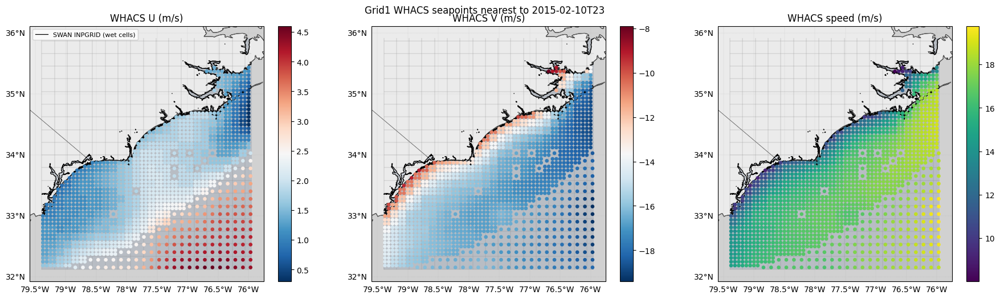

Seapoints: 1439
INPGRID nodes: 911 x 827 (grid lines every 50 cells)
INPGRID extent: lon [-79.3937, -75.9521], lat [32.1271, 35.9188]
Wet cells: 442364


In [3]:
# Grid1 WHACS seapoints (INPGRID domain)
import cartopy.crs as ccrs
import cartopy.feature as cfeature


def add_nc_basemap(ax, lon_min, lon_max, lat_min, lat_max, pad=0.2):
    ax.set_extent(
        [lon_min - pad, lon_max + pad, lat_min - pad, lat_max + pad],
        crs=ccrs.PlateCarree(),
    )
    ax.add_feature(cfeature.LAND.with_scale("10m"), facecolor="0.92", edgecolor="none", zorder=0)
    ax.add_feature(cfeature.OCEAN.with_scale("10m"), facecolor="0.82", zorder=0)
    ax.add_feature(cfeature.COASTLINE.with_scale("10m"), linewidth=0.8, zorder=1)
    ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="0.45", linewidth=0.5, zorder=1)
    gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0.5, linestyle="--")
    gl.top_labels = False
    gl.right_labels = False


def plot_inpgrid(ax, lon_inp, lat_inp, wet_map, *, grid_step=50, label=None):
    """Overlay SWAN INPGRID nodes: wet mask, sparse mesh lines, domain outline."""
    ax.pcolormesh(
        lon_inp,
        lat_inp,
        np.where(wet_map, 1.0, np.nan),
        cmap="Blues",
        alpha=0.12,
        vmin=0,
        vmax=1,
        transform=ccrs.PlateCarree(),
        shading="auto",
        zorder=1,
    )
    for i in range(0, lon_inp.shape[0], grid_step):
        ax.plot(
            lon_inp[i, :],
            lat_inp[i, :],
            color="0.55",
            lw=0.25,
            transform=ccrs.PlateCarree(),
            zorder=2,
        )
    for j in range(0, lon_inp.shape[1], grid_step):
        ax.plot(
            lon_inp[:, j],
            lat_inp[:, j],
            color="0.55",
            lw=0.25,
            transform=ccrs.PlateCarree(),
            zorder=2,
        )
    ax.contour(
        lon_inp,
        lat_inp,
        wet_map.astype(float),
        levels=[0.5],
        colors="k",
        linewidths=0.9,
        transform=ccrs.PlateCarree(),
        zorder=3,
    )
    if label is not None:
        ax.plot([], [], "k-", lw=0.9, label=label)


target_time = "2015-02-10 23:00:00"

with xr.open_dataset(UWND_NC) as u_ds, xr.open_dataset(VWND_NC) as v_ds:
    ts = np.datetime64(pd.Timestamp(target_time))
    u = u_ds["uwnd"].sel(time=ts, method="nearest").values
    v = v_ds["vwnd"].sel(time=ts, method="nearest").values
    lon = u_ds["longitude"].sel(time=ts, method="nearest").values
    lat = u_ds["latitude"].sel(time=ts, method="nearest").values

spd = np.hypot(u, v)

lon_inp, lat_inp = whacs_wind.build_inpgrid_lonlat()
depth = np.loadtxt(GRID_DIR / "inputs/CASES_ONLY_WIND/000/depth.dat")
wet_map = np.flipud(np.isfinite(depth) & (depth > 0))

lon_min, lon_max = float(lon_inp.min()), float(lon_inp.max())
lat_min, lat_max = float(lat_inp.min()), float(lat_inp.max())
map_pad = 0.2
grid_step = 50

fig, axs = plt.subplots(
    1, 3, figsize=(18, 5), subplot_kw={"projection": ccrs.PlateCarree()}, constrained_layout=True
)

for i, ax in enumerate(axs):
    add_nc_basemap(ax, lon_min, lon_max, lat_min, lat_max, pad=map_pad)
    plot_inpgrid(
        ax,
        lon_inp,
        lat_inp,
        wet_map,
        grid_step=grid_step,
        label="SWAN INPGRID (wet cells)" if i == 0 else None,
    )

sc0 = axs[0].scatter(lon, lat, c=u, s=14, cmap="RdBu_r", transform=ccrs.PlateCarree(), zorder=4)
axs[0].set_title("WHACS U (m/s)")
plt.colorbar(sc0, ax=axs[0], fraction=0.046)

sc1 = axs[1].scatter(lon, lat, c=v, s=14, cmap="RdBu_r", transform=ccrs.PlateCarree(), zorder=4)
axs[1].set_title("WHACS V (m/s)")
plt.colorbar(sc1, ax=axs[1], fraction=0.046)

sc2 = axs[2].scatter(lon, lat, c=spd, s=14, cmap="viridis", transform=ccrs.PlateCarree(), zorder=4)
axs[2].set_title("WHACS speed (m/s)")
plt.colorbar(sc2, ax=axs[2], fraction=0.046)

axs[0].legend(loc="upper left", fontsize=8)
plt.suptitle(
    f"Grid1 WHACS seapoints nearest to {np.datetime_as_string(ts, unit='h')}",
    y=1.02,
)
plt.show()

print(f"Seapoints: {len(lon)}")
print(f"INPGRID nodes: {lon_inp.shape[0]} x {lon_inp.shape[1]} (grid lines every {grid_step} cells)")
print(
    f"INPGRID extent: lon [{lon_min:.4f}, {lon_max:.4f}], "
    f"lat [{lat_min:.4f}, {lat_max:.4f}]"
)
print(f"Wet cells: {int(wet_map.sum())}")


## 2. PCA on seapoints



In [4]:
from bluemath_tk.datamining.pca import PCA

wind_pca_3h = wind_pca.resample(time="3h").mean()

n_sp = wind_pca_3h.sizes["seapoint"]
print(
    f"PCA basis: {n_sp} WHACS seapoints, {wind_pca_3h.sizes['time']} times (3-hourly)"
)

pca_winds = PCA(n_components=0.99)
pca_winds.fit_transform(
    data=wind_pca_3h,
    vars_to_stack=["uwnd", "vwnd"],
    coords_to_stack=["seapoint"],
    pca_dim_for_rows="time",
)
print("n_components:", pca_winds.pca.n_components_)


PCA basis: 1439 WHACS seapoints, 128568 times (3-hourly)

        -------------------------------------------------------------------
        | Initializing PCA reduction model with the following parameters:
        |    - n_components: 0.99
        |    - is_incremental: False
        | For more information, please refer to the documentation.
        -------------------------------------------------------------------
        


2026-06-30 17:38:33,992 - PCA - WARNING - Using 1439 out of 1439 available variablesIf this is originated by using few times, please check 'nan_threshold_to_drop' parameter in fit method
2026-06-30 17:38:35,633 - PCA - WARNING - Using 1439 out of 1439 available variablesIf this is originated by using few times, please check 'nan_threshold_to_drop' parameter in fit method


n_components: 11


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
1980-01-01 00:00:00,-30.527089,26.358675,-31.942763,13.296791,-7.590316,1.085604,5.610917,8.921842,3.757570,3.562720,1.782521
1980-01-01 03:00:00,-29.592935,27.141840,-31.971270,12.439497,-4.753874,2.814425,6.382012,9.443234,5.516528,-0.555005,-1.210344
1980-01-01 06:00:00,-23.597487,31.246898,-32.818863,15.468167,-1.887324,4.009763,8.041249,8.425623,5.623993,-2.664024,-2.983627
1980-01-01 09:00:00,-17.571367,37.870724,-28.431813,16.245011,-0.497605,3.141927,8.296655,6.278046,5.397919,-1.210428,-3.878470
1980-01-01 12:00:00,-10.947761,36.782890,-26.550992,18.501417,1.967099,2.915122,8.223201,4.550769,4.023820,-0.716167,-5.490190


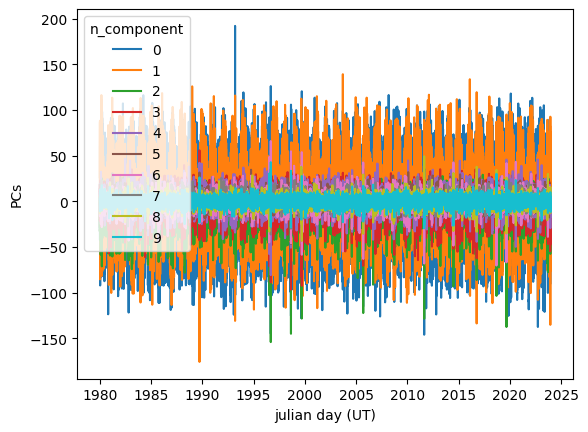

In [5]:
pca_winds.plot_pcs(num_pcs=10)
data = pca_winds.pcs_df.copy()
feature_cols = [c for c in data.columns if c.startswith("PC")]
data = data.loc[:, feature_cols]
data.head()


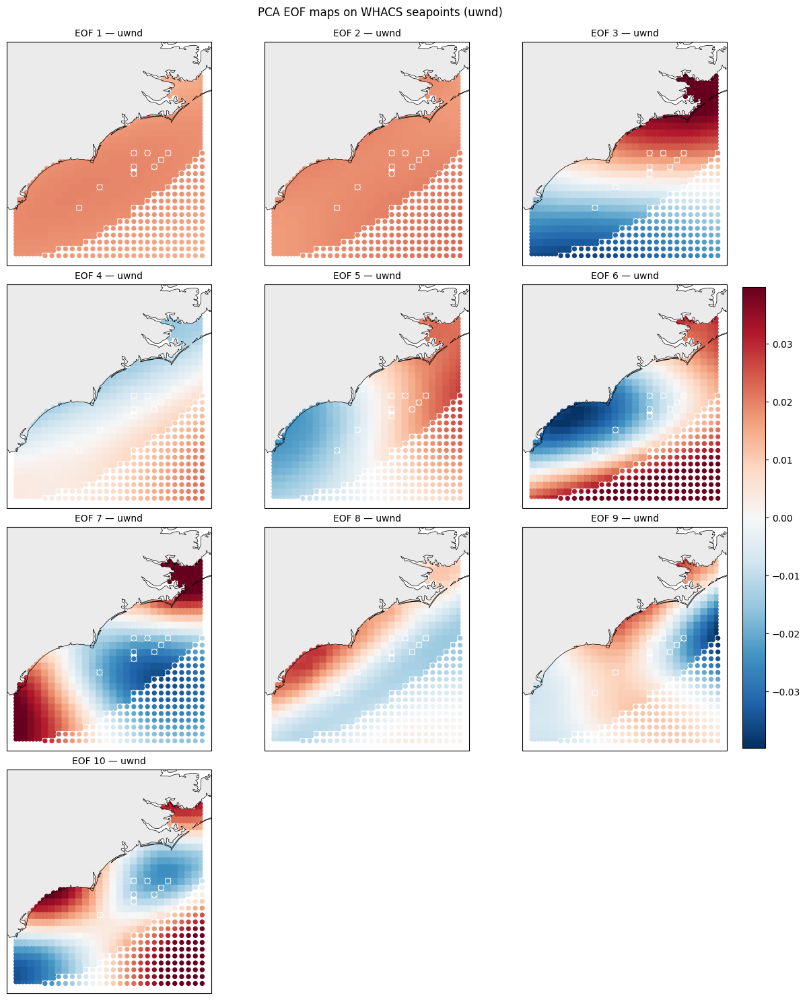

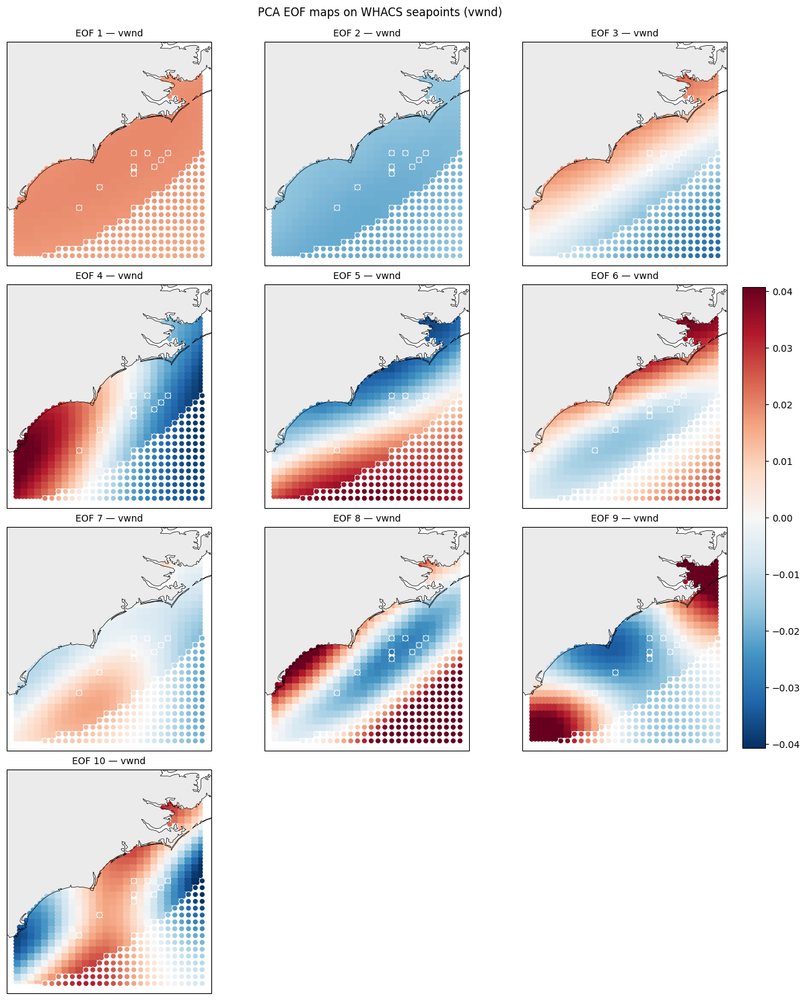

In [6]:
import importlib
importlib.reload(whacs_wind)

# bluemath plot_eofs() expects 2-D lat/lon; seapoint PCA needs geographic scatter maps
whacs_wind.plot_eof_maps(
    pca_winds,
    wind_pca,
    vars_to_plot=["uwnd", "vwnd"],
    num_eofs=10,
)


## 3. MDA



In [7]:
from bluemath_tk.datamining.mda import MDA

n_mda_centers = 20000
mda_ob = MDA(num_centers=n_mda_centers)
mda_ob.logger_disabled = True
custom_scale_factor = {}
columns_names = tuple(c for c in data.columns if c.startswith("PC"))

for col in columns_names:
    vmin = float(data[col].min())
    vmax = float(data[col].max())
    if vmin == vmax:
        vmax = vmin + 1e-6
    custom_scale_factor[col] = [vmin, vmax]

mda_ob.fit(
    data=data.loc[:, list(columns_names)],
    directional_variables=[],
    normalize_data=True,
    custom_scale_factor=custom_scale_factor,
)
print("MDA centroids:", len(mda_ob.centroid_real_indices))


MDA centroids: 20000


## 4. KMA



In [8]:
from bluemath_tk.datamining.kma import KMA

n_clusters = 250
kma_df = data.iloc[mda_ob.centroid_real_indices].copy()
kma_df = kma_df.loc[:, list(columns_names)].sort_index()

kma_ob = KMA(num_clusters=n_clusters, seed=0, algorithm="kmeans")
kma_ob.logger_disabled = True
custom_scale_factor = {}
for col in columns_names:
    vmin = float(kma_df[col].min())
    vmax = float(kma_df[col].max())
    if vmin == vmax:
        vmax = vmin + 1e-6
    custom_scale_factor[col] = [vmin, vmax]

kma_ob.fit(
    data=kma_df,
    directional_variables=[],
    normalize_data=True,
    custom_scale_factor=custom_scale_factor,
)

predict_data = data.loc[:, list(kma_df.columns)].copy().sort_index()
nearest_centroids_idxs, nearest_centroids_df = kma_ob.predict(data=predict_data)
print("BMU assignments:", len(nearest_centroids_idxs))


BMU assignments: 128568


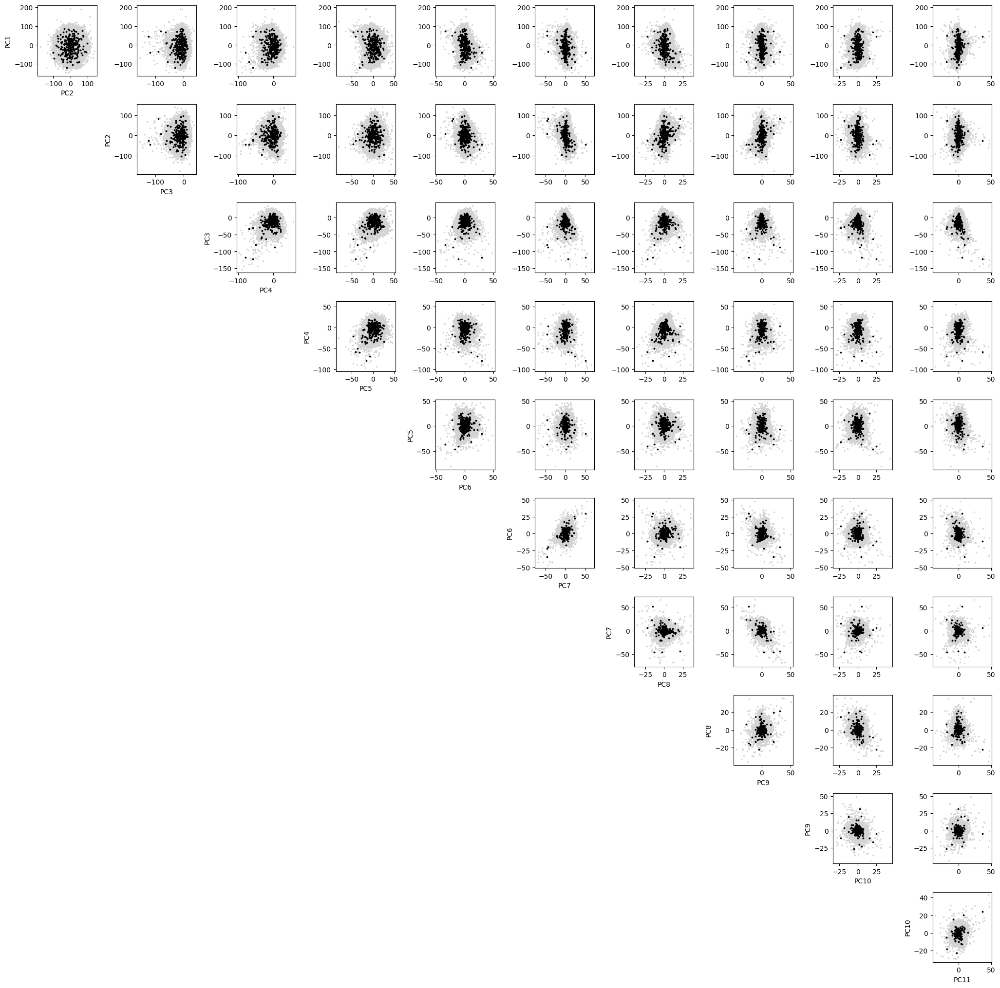

In [9]:
fig, axes = plt.subplots(len(kma_df.columns),len(kma_df.columns), figsize=(2*len(kma_df.columns), 2*len(kma_df.columns)))

for i in range(len(kma_df.columns)):
    for j in range(len(kma_df.columns)):
        if i >= j:              # lower triangle
            axes[i, j].set_visible(False)
        else:
            axes[i,j].scatter(kma_df[kma_df.columns[j]],kma_df[kma_df.columns[i]], color='lightgray',s=2)
            axes[i,j].scatter(kma_ob.centroids[kma_df.columns[j]], kma_ob.centroids[kma_df.columns[i]], color='k',s=3)
            if j-i == 1:
                axes[i,j].set_xlabel(kma_df.columns[j])
                axes[i,j].set_ylabel(kma_df.columns[i])

plt.tight_layout()
# Save figure
fig.savefig(f'outputs/Figures/correlation_matrix_kma_Winds.png', dpi=150, bbox_inches='tight')
plt.show()

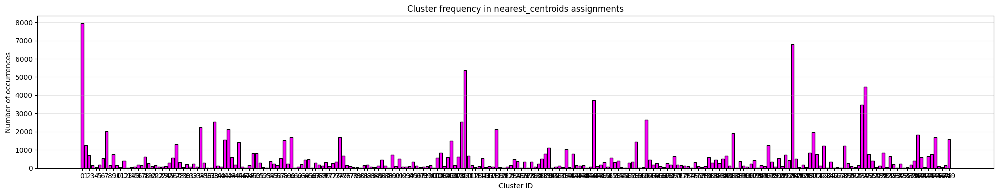

In [10]:
# Histogram: how often each cluster appears in the KMA assignments

# Use the labels from nearest_centroids_idxs (each row = one time step)
cluster_ids = nearest_centroids_idxs["kma_bmus"]

# Count occurrences per cluster ID
cluster_counts = cluster_ids.value_counts().sort_index()

fig, ax = plt.subplots(figsize=(20, 4))
ax.bar(cluster_counts.index, cluster_counts.values, width=0.8, color='fuchsia', edgecolor="k")

ax.set_xlabel("Cluster ID")
ax.set_ylabel("Number of occurrences")
ax.set_title("Cluster frequency in nearest_centroids assignments")
ax.set_xticks(cluster_counts.index)
ax.grid(axis="y", alpha=0.3)

plt.tight_layout()
# Save figure
fig.savefig(OUT_FIG / "histogram_cluster_frequency_KMA.png", dpi=150, bbox_inches="tight")

plt.show()

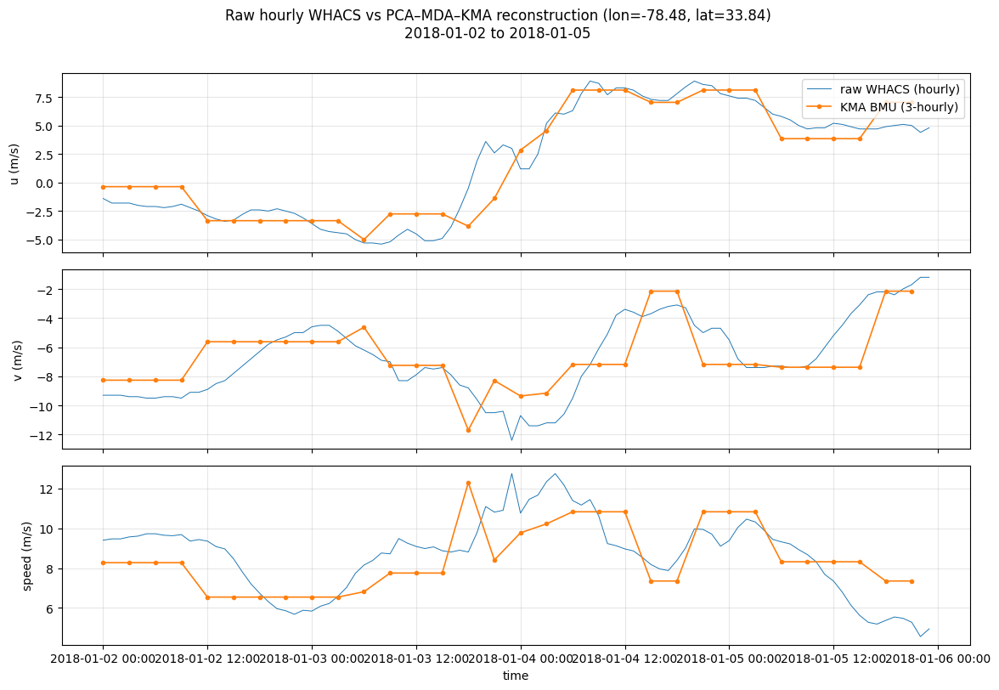

hourly raw: n=96 | KMA: n=32 (3-hourly)
RMSE at 3-hourly stamps — u=1.550, v=1.770, speed=1.533 m/s


In [16]:
# Time series: raw hourly WHACS vs KMA-reconstructed wind (PCA → MDA → KMA)
import importlib
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
import xarray as xr

import whacs_wind
importlib.reload(whacs_wind)

# # --- user inputs ---
# t_start = "2015-02-09"
# t_end = "2015-02-15"

t_start = "2018-01-02"
t_end = "2018-01-05"

point_lon = -78.484 # e.g. -76.5; leave None for domain-mean wind
point_lat = 33.838  # e.g. 35.0

GRID_DIR = Path(".").resolve()

if "pca_winds" not in globals():
    raise RuntimeError("Run the PCA cell first (pca_winds).")
if "wind_pca" in globals():
    wind_base = wind_pca
elif "wind_ds" in globals():
    wind_base = whacs_wind.pca_ready_wind(wind_ds)
else:
    raise RuntimeError("Run the data-load cell first (wind_ds / wind_pca).")

# Raw hourly WHACS on the same valid PCA grid used for clustering
wind_hourly = wind_base.sel(time=slice(t_start, t_end))

if "nearest_centroids_idxs" in globals():
    bmu_idx = nearest_centroids_idxs.copy()
else:
    bmu_idx = pd.read_csv(
        GRID_DIR / "outputs/KMA/nearest_centroids_idxs_kma_pcs.csv",
        index_col=0,
        parse_dates=True,
    )
bmu_idx = bmu_idx.sort_index()

times_kma = bmu_idx.loc[t_start:t_end].index
if len(times_kma) == 0:
    raise ValueError(f"No KMA assignments between {t_start} and {t_end}")

# Inverse-PCA wind field for each KMA cluster (BMU prototype in u/v space)
if "cluster_wind" not in globals():
    if "kma_ob" in globals() and hasattr(kma_ob, "centroids") and not kma_ob.centroids.empty:
        centroids_pc = kma_ob.centroids.copy()
    else:
        centroids_pc = pd.read_csv(GRID_DIR / "outputs/KMA/centroids_kma_pcs.csv", index_col=0)

    pc_cols = [c for c in centroids_pc.columns if c.startswith("PC")]
    pcs_ds = xr.Dataset(
        {"PCs": (("time", "n_component"), centroids_pc[pc_cols].to_numpy())},
        coords={
            "time": centroids_pc.index.astype(int),
            "n_component": np.arange(len(pc_cols)),
        },
    )
    cluster_wind = pca_winds.inverse_transform(pcs_ds)


def _nearest_seapoint(ref_uv, lon, lat):
    lon_s, lat_s = whacs_wind.median_seapoint_lonlat(ref_uv)
    d2 = (lon_s - lon) ** 2 + (lat_s - lat) ** 2
    return int(np.nanargmin(d2))


def _wind_components(ds_uv, lon=None, lat=None, *, seapoint_idx=None, ref_uv=None):
    if seapoint_idx is None and lon is not None and lat is not None:
        ref_uv = wind_base if ref_uv is None else ref_uv
        seapoint_idx = _nearest_seapoint(ref_uv, lon, lat)
    if seapoint_idx is not None:
        u = ds_uv["uwnd"].isel(seapoint=seapoint_idx)
        v = ds_uv["vwnd"].isel(seapoint=seapoint_idx)
    else:
        u = ds_uv["uwnd"].mean(dim="seapoint", skipna=True)
        v = ds_uv["vwnd"].mean(dim="seapoint", skipna=True)
    return u, v


seapoint_idx = (
    _nearest_seapoint(wind_base, point_lon, point_lat)
    if point_lon is not None and point_lat is not None
    else None
)

# --- raw hourly WHACS ---
raw_u, raw_v = _wind_components(wind_hourly, seapoint_idx=seapoint_idx)
raw_spd = np.hypot(raw_u, raw_v)
raw_times = pd.to_datetime(raw_u.time.values)

# --- simplified KMA wind (3-hourly cluster assignment + inverse PCA) ---
bmus = bmu_idx.loc[times_kma, "kma_bmus"].astype(int).to_numpy()

if seapoint_idx is not None:
    kma_u_field = cluster_wind["uwnd"].isel(seapoint=seapoint_idx)
    kma_v_field = cluster_wind["vwnd"].isel(seapoint=seapoint_idx)
else:
    kma_u_field = cluster_wind["uwnd"].mean(dim="seapoint", skipna=True)
    kma_v_field = cluster_wind["vwnd"].mean(dim="seapoint", skipna=True)

kma_u = kma_u_field.sel(time=bmus).assign_coords(time=times_kma)
kma_v = kma_v_field.sel(time=bmus).assign_coords(time=times_kma)
kma_spd = np.hypot(kma_u, kma_v)

# Raw WHACS at the same 3-hourly stamps (for fair RMSE vs KMA)
raw_at_kma = wind_hourly.sel(time=times_kma, method="nearest")
raw_kma_u, raw_kma_v = _wind_components(raw_at_kma, seapoint_idx=seapoint_idx)
raw_kma_spd = np.hypot(raw_kma_u, raw_kma_v)

loc_label = (
    f"lon={point_lon:.2f}, lat={point_lat:.2f}"
    if point_lon is not None
    else "domain mean (PCA grid)"
)

fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True)

for ax, raw_y, kma_y, ylab in zip(
    axes,
    [raw_u, raw_v, raw_spd],
    [kma_u, kma_v, kma_spd],
    ["u (m/s)", "v (m/s)", "speed (m/s)"],
):
    ax.plot(raw_times, raw_y, color="C0", lw=0.7, label="raw WHACS (hourly)")
    ax.plot(times_kma, kma_y, color="C1", lw=1.2, marker="o", ms=3, label="KMA BMU (3-hourly)")
    ax.set_ylabel(ylab)
    ax.grid(alpha=0.3)

axes[0].legend(loc="upper right")
axes[2].set_xlabel("time")
axes[2].xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))

fig.suptitle(
    f"Raw hourly WHACS vs PCA–MDA–KMA reconstruction ({loc_label})\n{t_start} to {t_end}",
    y=1.01,
)
plt.tight_layout()
plt.show()

rmse_u = float(np.sqrt(np.nanmean((raw_kma_u.values - kma_u.values) ** 2)))
rmse_v = float(np.sqrt(np.nanmean((raw_kma_v.values - kma_v.values) ** 2)))
rmse_spd = float(np.sqrt(np.nanmean((raw_kma_spd.values - kma_spd.values) ** 2)))
print(
    f"hourly raw: n={len(raw_times)} | KMA: n={len(times_kma)} (3-hourly)\n"
    f"RMSE at 3-hourly stamps — u={rmse_u:.3f}, v={rmse_v:.3f}, speed={rmse_spd:.3f} m/s"
)

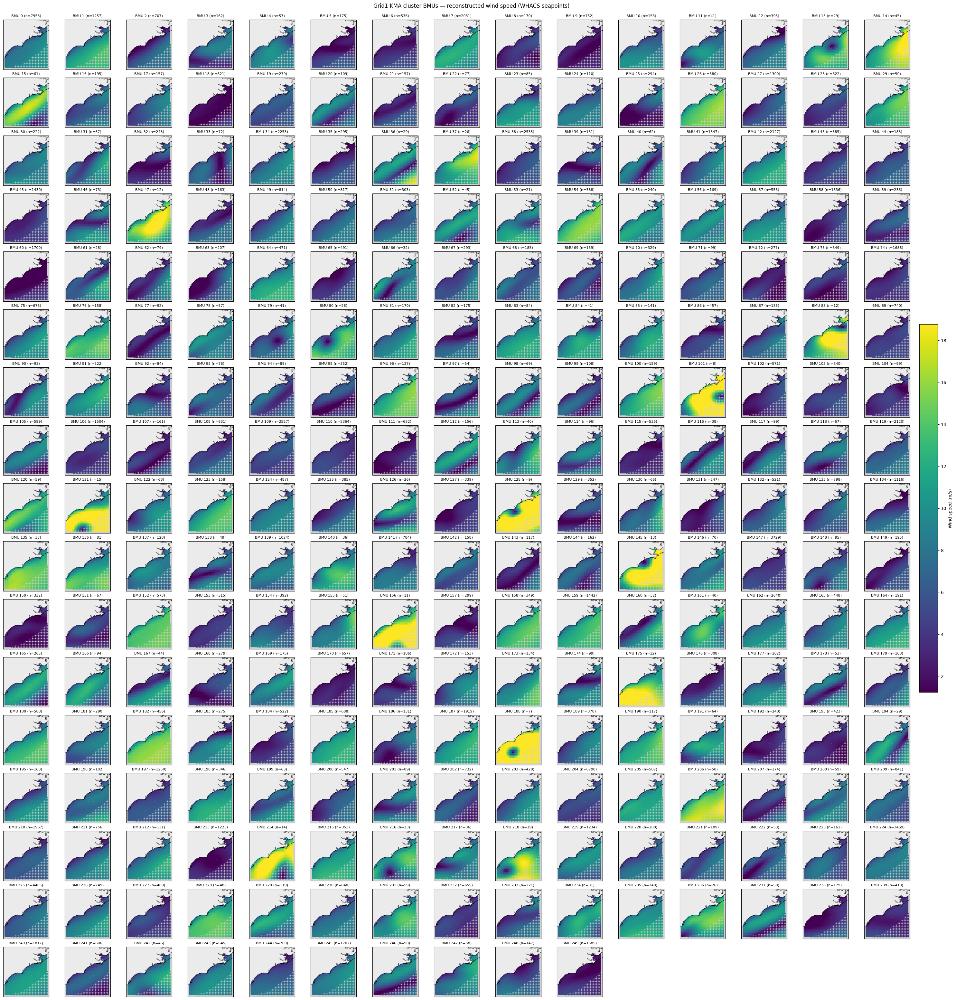

Saved: /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1/outputs/Figures/kma_cluster_bmu_maps_wind_speed.png


In [13]:
# GRID KMA BMU maps — inverse PCA wind speed on WHACS seapoints
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import xarray as xr

if "kma_ob" in globals() and hasattr(kma_ob, "centroids") and not kma_ob.centroids.empty:
    centroids_pc = kma_ob.centroids.copy()
else:
    centroids_pc = pd.read_csv(OUT_KMA / "centroids_kma_pcs.csv", index_col=0)

pc_cols = [c for c in centroids_pc.columns if c.startswith("PC")]
if len(pc_cols) != pca_winds.pca.n_components_:
    raise ValueError(
        f"KMA centroids have {len(pc_cols)} PCs but fitted PCA has {pca_winds.pca.n_components_}"
    )

pcs_ds = xr.Dataset(
    {"PCs": (("time", "n_component"), centroids_pc[pc_cols].to_numpy())},
    coords={
        "time": centroids_pc.index.astype(int),
        "n_component": np.arange(len(pc_cols)),
    },
)
cluster_wind = pca_winds.inverse_transform(pcs_ds)
speed = np.hypot(cluster_wind["uwnd"], cluster_wind["vwnd"])

lon, lat = whacs_wind.median_seapoint_lonlat(wind_pca)
bmu_ids = centroids_pc.index.astype(int)
n_clusters = len(bmu_ids)

if "nearest_centroids_idxs" in globals():
    cluster_counts = (
        nearest_centroids_idxs["kma_bmus"]
        .value_counts()
        .reindex(bmu_ids)
        .fillna(0)
        .astype(int)
    )
else:
    bmu_idx = pd.read_csv(OUT_KMA / "nearest_centroids_idxs_kma_pcs.csv", index_col=0)
    cluster_counts = (
        bmu_idx["kma_bmus"].value_counts().reindex(bmu_ids).fillna(0).astype(int)
    )

lon_inp, lat_inp = whacs_wind.build_inpgrid_lonlat()
map_pad = 0.15
extent = [
    float(lon_inp.min()) - map_pad,
    float(lon_inp.max()) + map_pad,
    float(lat_inp.min()) - map_pad,
    float(lat_inp.max()) + map_pad,
]

vmin, vmax = np.nanpercentile(speed.values, [2, 98])
cmap = plt.cm.viridis

n_cols = 15
n_rows = int(np.ceil(n_clusters / n_cols))
fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(2.0 * n_cols, 1.8 * n_rows),
    subplot_kw={"projection": ccrs.PlateCarree()},
    constrained_layout=True,
)
axes = np.atleast_2d(axes)

for i, bmu_id in enumerate(bmu_ids):
    ax = axes[i // n_cols, i % n_cols]
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND.with_scale("10m"), facecolor="0.92", edgecolor="none", zorder=0)
    ax.add_feature(cfeature.OCEAN.with_scale("10m"), facecolor="0.82", zorder=0)
    ax.add_feature(cfeature.COASTLINE.with_scale("10m"), linewidth=0.4, zorder=2)

    field = speed.sel(time=bmu_id).values
    sc = ax.scatter(
        lon, lat, c=field, s=6, cmap=cmap, vmin=vmin, vmax=vmax,
        transform=ccrs.PlateCarree(), zorder=1,
    )
    ax.set_title(f"BMU {bmu_id} (n={int(cluster_counts.loc[bmu_id])})", fontsize=8)
    ax.set_xticks([])
    ax.set_yticks([])

for j in range(n_clusters, n_rows * n_cols):
    axes[j // n_cols, j % n_cols].set_visible(False)

cbar = fig.colorbar(sc, ax=axes.ravel().tolist(), fraction=0.02, pad=0.01)
cbar.set_label("Wind speed (m/s)")

fig.suptitle("Grid1 KMA cluster BMUs — reconstructed wind speed (WHACS seapoints)", y=1.01, fontsize=12)
fig_path = OUT_FIG / "kma_cluster_bmu_maps_wind_speed.png"
fig.savefig(fig_path, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: {fig_path}")

In [14]:
kma_ob.centroids.to_csv(OUT_KMA / "centroids_kma_pcs.csv")
nearest_centroids_idxs.to_csv(OUT_KMA / "nearest_centroids_idxs_kma_pcs.csv")
nearest_centroids_df.to_csv(OUT_KMA / "nearest_centroids_df_kma_pcs.csv")
print("Saved KMA CSVs to", OUT_KMA)


Saved KMA CSVs to /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1/outputs/KMA


## 5. Export cluster winds + build SWAN cases



Inverse PCA → seapoint u/v per BMU, then `griddata` onto SWAN INPGRID (same as dynamic).



In [30]:
import importlib

if str(CASES_ROOT) not in sys.path:
    sys.path.insert(0, str(CASES_ROOT))
import generate_cases as gc
importlib.reload(gc)

cluster_wind_nc = OUT_KMA / "cluster_wind_bmu.nc"
gc.export_cluster_wind_nc(
    centroids_csv=OUT_KMA / "centroids_kma_pcs.csv",
    out_nc=cluster_wind_nc,
    pca_winds=pca_winds,
    force=True,
)

cases = gc.generate_swan_cluster_case_library(
    base_cases_dir=CASES_ROOT,
    cluster_wind_nc=cluster_wind_nc,
    depth_static=GRID_DIR / "inputs/depth.dat",
    input_static=CASES_ROOT / "000/INPUT",
    locations_static=CASES_ROOT / "000/locations.loc",
    grid_params=gc.GRID_PARAMS,
    cluster_start=0,
    cluster_end=n_clusters-1,
    rewrite_wind=True,
)
print(f"Built {len(cases)} cluster case folders")


Wrote cluster wind fields: /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1/outputs/KMA/cluster_wind_bmu.nc (250 clusters)
Built 250 cluster case folders


## 6. Check SWAN input wind (`wind_file.dat`) before running SWAN

Plot cluster forcing on the INPGRID (depth-only mask, same as dynamic). Check that **ocean zero-wind ≈ 0** and patterns look coastal — no diagonal wedges.

100: shape (911, 827), wet=442364, ocean zero-wind=0/442364
  mean u=10.46, v=-1.79, speed=10.72 m/s
Saved: /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1/outputs/Figures/input_wind_bmu_100.png


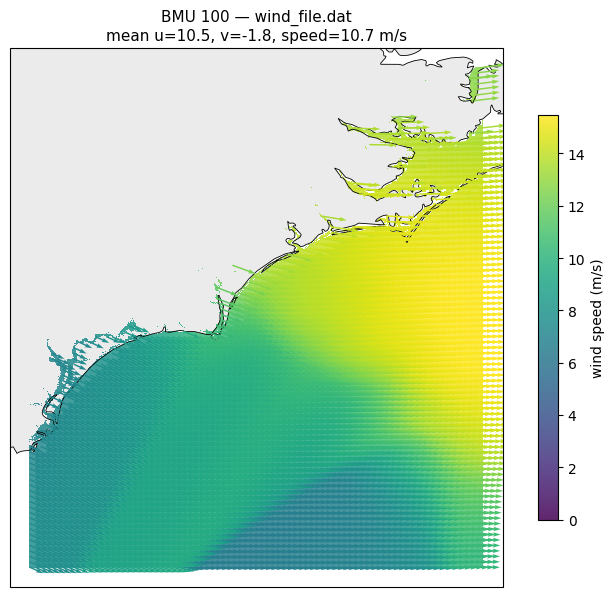

In [36]:
import importlib
importlib.reload(whacs_wind)

# BMUs to inspect — e.g. "000", "001", ...
check_bmus = ["100"]

# Arrow density: plot every Nth grid point (higher = fewer arrows, easier to read)
QUIVER_STEP = 10  # try 5, 10, 15, 20 ...

for bmu in check_bmus:
    case_dir = CASES_ROOT / bmu
    wind_path = case_dir / "wind_file.dat"
    depth_dat = case_dir / "depth.dat"
    if not wind_path.is_file():
        print(f"SKIP {bmu}: no {wind_path} — run §5 with rewrite_wind=True first")
        continue
    whacs_wind.plot_wind_file_input(
        wind_path,
        depth_path=depth_dat,
        out_fig=OUT_FIG / f"input_wind_bmu_{bmu}.png",
        quiver_step=QUIVER_STEP,
    )


## 7. (Optional) Run one SWAN case for a quick check

After SWAN finishes, run **§8** below (last cells) or open `GRID/swan_output_check.ipynb`.


In [37]:
# Example: run BMU 036 only (adjust after you look up storm BMUs in nearest_centroids_idxs)
import subprocess
swan_exe = "/nfs/software/geocean/swan/swan.exe"
case_dir = CASES_ROOT / "100"
if case_dir.is_dir():
    subprocess.run([swan_exe], cwd=str(case_dir), check=False)
    print("norm_end exists:", (case_dir / "norm_end").exists())
else:
    print("Case folder not found:", case_dir)



 SWAN is preparing computation

 Number of threads during execution of parallel region = 48

 iteration    1; sweep 1
+iteration    1; sweep 2
+iteration    1; sweep 3
+iteration    1; sweep 4
 not possible to compute, first iteration

 iteration    2; sweep 1
+iteration    2; sweep 2
+iteration    2; sweep 3
+iteration    2; sweep 4
 accuracy OK in  30.12 % of wet grid points ( 99.50 % required)

 iteration    3; sweep 1
+iteration    3; sweep 2
+iteration    3; sweep 3
+iteration    3; sweep 4
 accuracy OK in  17.15 % of wet grid points ( 99.50 % required)

 iteration    4; sweep 1
+iteration    4; sweep 2
+iteration    4; sweep 3
+iteration    4; sweep 4
 accuracy OK in  29.73 % of wet grid points ( 99.50 % required)

 iteration    5; sweep 1
+iteration    5; sweep 2
+iteration    5; sweep 3
+iteration    5; sweep 4
 accuracy OK in  43.81 % of wet grid points ( 99.50 % required)

 iteration    6; sweep 1
+iteration    6; sweep 2
+iteration    6; sweep 3
+iteration    6; sweep 4
 ac

## Checking inputs and outputs

1. **`buoys_geo`** — buoy names and coordinates
2. **Build `BinWaves_BMUS`** — run the cell below once (or `bash utils/build_kma_merged_grids.sh` in a terminal)
3. **Point time series** — BinWaves vs BMUS vs combined vs buoy at one site
4. **Spatial maps** — single-hour SWAN grid snapshot at `EVENT_TIME`
5. **Buoy bulk validation** — Hs/Tp/Dir scatter for all buoys in `buoys_geo`


In [7]:
# Time series: raw hourly WHACS vs KMA-reconstructed wind (PCA → MDA → KMA)
import importlib
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
import xarray as xr

import whacs_wind
importlib.reload(whacs_wind)

# --- user inputs ---
t_start = "2019-09-28"
t_end = "2019-10-10"

# point_lon = -75.714 # e.g. -76.5; leave None for domain-mean wind
# point_lat = 36.200  # e.g. 35.0

GRID1_DIR = Path(".").resolve()

if "pca_winds" not in globals():
    raise RuntimeError("Run the PCA cell first (pca_winds).")
if "wind_pca" in globals():
    wind_base = wind_pca
elif "wind_ds" in globals():
    wind_base = whacs_wind.pca_ready_wind(wind_ds)
else:
    raise RuntimeError("Run the data-load cell first (wind_ds / wind_pca).")

# Raw hourly WHACS on the same valid PCA grid used for clustering
wind_hourly = wind_base.sel(time=slice(t_start, t_end))

if "nearest_centroids_idxs" in globals():
    bmu_idx = nearest_centroids_idxs.copy()
else:
    bmu_idx = pd.read_csv(
        GRID1_DIR / "outputs/KMA/nearest_centroids_idxs_kma_pcs.csv",
        index_col=0,
        parse_dates=True,
    )
bmu_idx = bmu_idx.sort_index()

times_kma = bmu_idx.loc[t_start:t_end].index
if len(times_kma) == 0:
    raise ValueError(f"No KMA assignments between {t_start} and {t_end}")

# Inverse-PCA wind field for each KMA cluster (BMU prototype in u/v space)
if "cluster_wind" not in globals():
    if "kma_ob" in globals() and hasattr(kma_ob, "centroids") and not kma_ob.centroids.empty:
        centroids_pc = kma_ob.centroids.copy()
    else:
        centroids_pc = pd.read_csv(GRID1_DIR / "outputs/KMA/centroids_kma_pcs.csv", index_col=0)

    pc_cols = [c for c in centroids_pc.columns if c.startswith("PC")]
    pcs_ds = xr.Dataset(
        {"PCs": (("time", "n_component"), centroids_pc[pc_cols].to_numpy())},
        coords={
            "time": centroids_pc.index.astype(int),
            "n_component": np.arange(len(pc_cols)),
        },
    )
    cluster_wind = pca_winds.inverse_transform(pcs_ds)


def _nearest_seapoint(ref_uv, lon, lat):
    lon_s, lat_s = whacs_wind.median_seapoint_lonlat(ref_uv)
    d2 = (lon_s - lon) ** 2 + (lat_s - lat) ** 2
    return int(np.nanargmin(d2))


def _wind_components(ds_uv, lon=None, lat=None, *, seapoint_idx=None, ref_uv=None):
    if seapoint_idx is None and lon is not None and lat is not None:
        ref_uv = wind_base if ref_uv is None else ref_uv
        seapoint_idx = _nearest_seapoint(ref_uv, lon, lat)
    if seapoint_idx is not None:
        u = ds_uv["uwnd"].isel(seapoint=seapoint_idx)
        v = ds_uv["vwnd"].isel(seapoint=seapoint_idx)
    else:
        u = ds_uv["uwnd"].mean(dim="seapoint", skipna=True)
        v = ds_uv["vwnd"].mean(dim="seapoint", skipna=True)
    return u, v


seapoint_idx = (
    _nearest_seapoint(wind_base, point_lon, point_lat)
    if point_lon is not None and point_lat is not None
    else None
)

# --- raw hourly WHACS ---
raw_u, raw_v = _wind_components(wind_hourly, seapoint_idx=seapoint_idx)
raw_spd = np.hypot(raw_u, raw_v)
raw_times = pd.to_datetime(raw_u.time.values)

# --- simplified KMA wind (3-hourly cluster assignment + inverse PCA) ---
bmus = bmu_idx.loc[times_kma, "kma_bmus"].astype(int).to_numpy()

if seapoint_idx is not None:
    kma_u_field = cluster_wind["uwnd"].isel(seapoint=seapoint_idx)
    kma_v_field = cluster_wind["vwnd"].isel(seapoint=seapoint_idx)
else:
    kma_u_field = cluster_wind["uwnd"].mean(dim="seapoint", skipna=True)
    kma_v_field = cluster_wind["vwnd"].mean(dim="seapoint", skipna=True)

kma_u = kma_u_field.sel(time=bmus).assign_coords(time=times_kma)
kma_v = kma_v_field.sel(time=bmus).assign_coords(time=times_kma)
kma_spd = np.hypot(kma_u, kma_v)

# Raw WHACS at the same 3-hourly stamps (for fair RMSE vs KMA)
raw_at_kma = wind_hourly.sel(time=times_kma, method="nearest")
raw_kma_u, raw_kma_v = _wind_components(raw_at_kma, seapoint_idx=seapoint_idx)
raw_kma_spd = np.hypot(raw_kma_u, raw_kma_v)

loc_label = (
    f"lon={point_lon:.2f}, lat={point_lat:.2f}"
    if point_lon is not None
    else "domain mean (PCA grid)"
)

fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True)

for ax, raw_y, kma_y, ylab in zip(
    axes,
    [raw_u, raw_v, raw_spd],
    [kma_u, kma_v, kma_spd],
    ["u (m/s)", "v (m/s)", "speed (m/s)"],
):
    ax.plot(raw_times, raw_y, color="C0", lw=0.7, label="raw WHACS (hourly)")
    ax.plot(times_kma, kma_y, color="C1", lw=1.2, marker="o", ms=3, label="KMA BMU (3-hourly)")
    ax.set_ylabel(ylab)
    ax.grid(alpha=0.3)

axes[0].legend(loc="upper right")
axes[2].set_xlabel("time")
axes[2].xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))

fig.suptitle(
    f"Raw hourly WHACS vs PCA–MDA–KMA reconstruction ({loc_label})\n{t_start} to {t_end}",
    y=1.01,
)
plt.tight_layout()
plt.show()

rmse_u = float(np.sqrt(np.nanmean((raw_kma_u.values - kma_u.values) ** 2)))
rmse_v = float(np.sqrt(np.nanmean((raw_kma_v.values - kma_v.values) ** 2)))
rmse_spd = float(np.sqrt(np.nanmean((raw_kma_spd.values - kma_spd.values) ** 2)))
print(
    f"hourly raw: n={len(raw_times)} | KMA: n={len(times_kma)} (3-hourly)\n"
    f"RMSE at 3-hourly stamps — u={rmse_u:.3f}, v={rmse_v:.3f}, speed={rmse_spd:.3f} m/s"
)

RuntimeError: Run the PCA cell first (pca_winds).

In [5]:

buoys_geo = {
     'SSBN7': (-78.484, 33.838),
     '41119': (-78.483, 33.842),
     'OCPN7': (-78.147, 33.911),
     '41108': (-78.016, 33.721), 
     '41013': (-77.764, 33.441),
     '41110': (-77.715, 34.142),
     '41109': (-77.300 ,34.484 ),
     '41035': (-77.281 ,34.476),
     '41036': (-76.949 , 34.207),
     '41159': (-76.944, 34.211),
     'WHACS2': (-77.125,34.0),
     'WHACS': (-77.75, 33.4375),
}


Event @ 2019-10-05 04:00 | window 2019-10-05 04:00 -> 2019-10-05 06:00 (3 h)


## Build BinWaves + BMUS merged hindcast

Required before the point comparison, spatial maps, and buoy validation cells.

Writes ShoreShop-format bulk NetCDFs to `outputs/BinWaves_BMUS/` by merging:
- BinWaves bulk from ShoreShop `cropped_variables` (`hs_grid1_masked.nc`, …)
- KMA cluster SWAN from `inputs/CASES_ONLY_WIND/<BMU>/output.mat`

**Terminal (recommended for long runs):**
```bash
# from this notebook's folder
bash utils/build_kma_merged_grids.sh
```

Or run the next cell with `RUN_BUILD_BINWAVES_BMUS = True`.

Note: grid1 already has all 250 cluster `output.mat` files; rebuild with `--overwrite` only if you need to refresh outputs.


In [ ]:
# Build outputs/BinWaves_BMUS (run once; long job — prefer terminal)
import subprocess
from pathlib import Path

if "GRID_DIR" not in globals():
    GRID_DIR = Path(".").resolve()

RUN_BUILD_BINWAVES_BMUS = False  # set True to launch build from the notebook

OUT = GRID_DIR / "outputs/BinWaves_BMUS"
expected = [
    OUT / "hs_grid1_BinWaves_BMUS.nc",
    OUT / "tp_grid1_BinWaves_BMUS.nc",
    OUT / "tm02_grid1_BinWaves_BMUS.nc",
    OUT / "dp_grid1_BinWaves_BMUS.nc",
    OUT / "dm_grid1_BinWaves_BMUS.nc",
]
missing = [p for p in expected if not p.is_file()]

if not missing:
    print("BinWaves_BMUS already built:")
    for p in expected:
        print(f"  {p}")
elif RUN_BUILD_BINWAVES_BMUS:
    print("Starting build_kma_merged_grids (this may take hours)...")
    subprocess.run(
        ["bash", "utils/build_kma_merged_grids.sh"],
        cwd=GRID_DIR,
        check=True,
    )
    still_missing = [p for p in expected if not p.is_file()]
    if still_missing:
        raise FileNotFoundError("Build finished but files still missing:\n  " + "\n  ".join(map(str, still_missing)))
    print("Build complete.")
else:
    print("Missing BinWaves_BMUS files (run build before comparison cells):")
    for p in missing:
        print(f"  {p}")
    print()
    print("Run in terminal:")
    print(f"  cd {GRID_DIR}")
    print("  bash utils/build_kma_merged_grids.sh")
    print()
    print("Or set RUN_BUILD_BINWAVES_BMUS = True and re-run this cell.")


Target buoy 41013: (-77.76400, 33.44100)
Using computed BinWaves_BMUS reference: /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1/outputs/BinWaves_BMUS/hs_grid1_BinWaves_BMUS.nc
Period: 2019-09-28 to 2019-10-10
Timeline: 289 hours from 2019-09-28 00:00:00 to 2019-10-10 00:00:00
Nearest ShoreShop/BinWaves site 9: (-77.76400, 33.44100), 0.0 m from target
BinWaves        : dm (mean Dir) all NaN for this period; using dp (peak Dir) on mean-direction panel
BinWaves        : loaded from /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/01_BinWaves/outputs/cropped_variables
BinWaves + BMUS : loaded from computed /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1/outputs/BinWaves_BMUS
Reference BMU mat: /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1/inputs/CASES_ONLY_WIND/000/output.mat
Nearest BMU SWAN grid point: (-77.76263, 33.44171), ~0.14 km from target
BMUS            : 

/tmp/ipykernel_3106609/866659485.py:355: RuntimeWarning: invalid value encountered in power
  return K2 * (t_pos ** (1 / 5)) * (h_pos ** (12 / 5)) * (cos_a ** (6 / 5)) * sin_a
/tmp/ipykernel_3106609/866659485.py:355: RuntimeWarning: invalid value encountered in power
  return K2 * (t_pos ** (1 / 5)) * (h_pos ** (12 / 5)) * (cos_a ** (6 / 5)) * sin_a


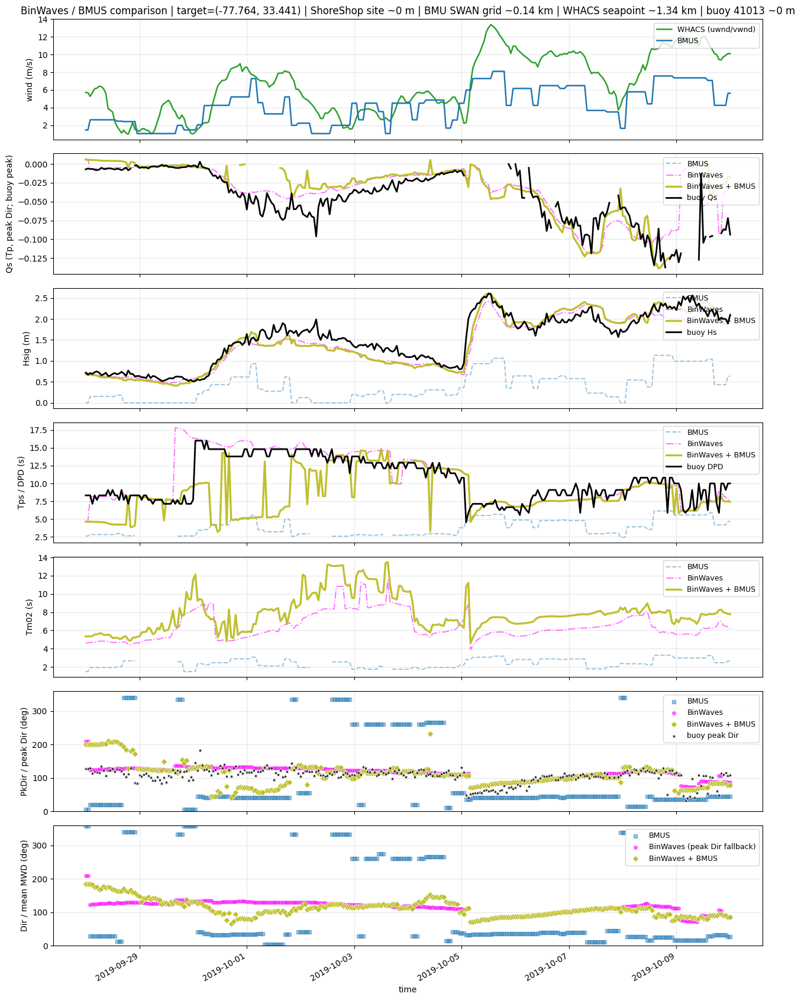

In [8]:
# Compare point time series: BinWaves vs BMUS vs BinWaves+BMUS vs buoy
from pathlib import Path
from scipy.io import loadmat
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import xarray as xr

GRID = GRID_DIR if "GRID_DIR" in globals() else Path(".").resolve()
CLUSTER_CASES_ROOT = GRID / "inputs/CASES_ONLY_WIND"
KMA_BMU_CSV = GRID / "outputs/KMA/nearest_centroids_idxs_kma_pcs.csv"
GRID_ID = 1
SHORESHOP_CROPPED = GRID.parents[1] / "01_BinWaves" / "outputs" / "cropped_variables"
BINWAVES_BMUS_ROOT = GRID / "outputs/BinWaves_BMUS"
BUOY_ROOT = GRID.parents[1] / "01_BinWaves" / "inputs" / "buoy_data"
# --- user inputs ---
# Buoy name from buoys_geo (run cell above), or (lon, lat) coordinates
TARGET = "41013"
# --- user inputs: time series window ---
t_start = "2019-09-28"
t_end = "2019-10-10"
# TARGET = (-78.484, 33.838)
# When TARGET is coordinates, match nearest buoy from buoys_geo within this distance (m)
MAX_BUOY_DIST_M = 5000.0
# Sediment transport (Qs): shore-normal direction (deg from N, clockwise)
SHORELINE_ORIENTATION_DEG = 161
QS_K2 = 0.023
QS_DIR_MODE = "peak"  # "mean" or "peak" wave direction for Qs
USE_COMPUTED_BINWAVES_BMUS = True  # combined series from outputs/BinWaves_BMUS
BINWAVES_LABEL = "BinWaves"
BINWAVES_COLOR = "fuchsia"
BMUS_LABEL = "BMUS"
BMUS_COLOR = "#1F77B4"
COMBINED_LABEL = "BinWaves + BMUS"
COMBINED_COLOR = "#BCBD22"
WHACS_LABEL = "WHACS (uwnd/vwnd)"
WHACS_COLOR = "#2CA02C"
UWND_NC = GRID / "inputs/uwnd.nc"
VWND_NC = GRID / "inputs/vwnd.nc"
BUOY_COLOR = "black"
MAT_NAMES = ("output.mat", "outputs.mat")
VAR_MAP = {
    "Hsig": "Hsig",
    "TPsmoo": "Tps",
    "Tm02": "Tm02",
    "Dir": "Dir",
    "PkDir": "pdir",
}
BULK_STEMS = {
    "Hsig": "hs",
    "Tps": "tp",
    "Tm02": "tm02",
    "pdir": "dp",
    "Dir": "dm",
}
def bulk_var_paths(root, grid_id, tag):
    gid = f"grid{grid_id}"
    return {
        label: (root / f"{stem}_{gid}_{tag}.nc", stem)
        for label, stem in BULK_STEMS.items()
    }
SHORESHOP_VAR_FILES = bulk_var_paths(SHORESHOP_CROPPED, GRID_ID, "masked")
BINWAVES_BMUS_VAR_FILES = bulk_var_paths(BINWAVES_BMUS_ROOT, GRID_ID, "BinWaves_BMUS")

def require_binwaves_bmus_files(var_files):
    missing = [str(nc_path) for _label, (nc_path, _vname) in var_files.items() if not nc_path.is_file()]
    if missing:
        raise FileNotFoundError(
            "Missing computed BinWaves_BMUS file(s). Run utils/build_kma_merged_grids first:\n  "
            + "\n  ".join(missing)
        )
def resolve_target(target, buoy_catalog):
    """Return (lon, lat, buoy_name_or_none) from a buoy name or coordinate pair."""
    if isinstance(target, str):
        key = target.strip()
        lookup = {name.upper(): (name, coord) for name, coord in buoy_catalog.items()}
        if key.upper() not in lookup:
            raise ValueError(
                f"Unknown buoy {target!r}. Choose from: {sorted(buoy_catalog)}"
            )
        buoy_name, (lon, lat) = lookup[key.upper()]
        return float(lon), float(lat), buoy_name
    if isinstance(target, (tuple, list, np.ndarray)) and len(target) == 2:
        lon, lat = float(target[0]), float(target[1])
        return lon, lat, None
    raise TypeError(
        "TARGET must be a buoy name (str) from buoys_geo or a (lon, lat) pair"
    )
def buoy_pickle_path(buoy_root, buoy_id):
    return buoy_root / f"buoy_{str(buoy_id).lower()}_bulk_parameters.pkl"
def load_buoy_timeseries(buoy_root, buoy_id, case_times):
    buoy_file = buoy_pickle_path(buoy_root, buoy_id)
    if not buoy_file.is_file():
        print(f"Buoy file missing: {buoy_file}")
        return None
    buoy_df = pd.read_pickle(buoy_file)
    buoy_df.index = pd.to_datetime(buoy_df.index)
    return buoy_df.loc[case_times[0] : case_times[-1]].reindex(case_times)
def select_buoy_for_target(target_lon, target_lat, buoy_catalog, buoy_root, named_buoy, max_dist_m):
    if named_buoy is not None:
        return named_buoy, 0.0
    nearest_id = None
    nearest_dist_m = np.inf
    for buoy_id, (blon, blat) in buoy_catalog.items():
        dist_m = haversine_m(target_lon, target_lat, blon, blat)
        if dist_m < nearest_dist_m:
            nearest_dist_m = dist_m
            nearest_id = buoy_id
    if nearest_id is None or nearest_dist_m > max_dist_m:
        print(
            f"No buoy within {max_dist_m:.0f} m "
            f"(nearest: {nearest_id}, {nearest_dist_m:.1f} m)"
        )
        return None, nearest_dist_m
    return nearest_id, nearest_dist_m
def load_bmu_assignments(csv_path):
    bmu = pd.read_csv(csv_path, index_col=0, parse_dates=True).sort_index()
    return bmu["kma_bmus"].astype(int)
def bmu_for_hourly_times(bmu_series, case_times):
    return bmu_series.reindex(pd.DatetimeIndex(case_times), method="nearest").astype(int)
def find_cluster_mat(cluster_root, cluster_id):
    case_dir = Path(cluster_root) / f"{int(cluster_id):03d}"
    for name in MAT_NAMES:
        mat_path = case_dir / name
        if mat_path.is_file():
            return mat_path
    return None
def find_reference_cluster_mat(cluster_root):
    for mat_path in sorted(Path(cluster_root).glob("[0-9][0-9][0-9]/output.mat")):
        return mat_path
    for mat_path in sorted(Path(cluster_root).glob("[0-9][0-9][0-9]/outputs.mat")):
        return mat_path
    return None
def extract_cluster_bmu_timeseries(cluster_root, case_times, bmu_by_time, iy, ix):
    labels = list(VAR_MAP.values()) + ["wind", "wind_u", "wind_v", "kma_bmu"]
    series = {label: np.full(len(case_times), np.nan) for label in labels}
    cluster_cache = {}
    n_mat = 0
    for i, ts in enumerate(case_times):
        cid = int(bmu_by_time.loc[ts])
        series["kma_bmu"][i] = cid
        if cid not in cluster_cache:
            mat_path = find_cluster_mat(cluster_root, cid)
            if mat_path is None:
                cluster_cache[cid] = None
            else:
                data = loadmat(mat_path, squeeze_me=True)
                pt = {}
                for mat_key, label in VAR_MAP.items():
                    if mat_key in data:
                        pt[label] = float(np.asarray(data[mat_key])[iy, ix])
                if "Windv_x" in data and "Windv_y" in data:
                    ux = float(np.asarray(data["Windv_x"])[iy, ix])
                    vy = float(np.asarray(data["Windv_y"])[iy, ix])
                    pt["wind_u"] = ux
                    pt["wind_v"] = vy
                    pt["wind"] = float(np.hypot(ux, vy))
                cluster_cache[cid] = pt
                n_mat += 1
        pt = cluster_cache.get(cid)
        if pt:
            for key, val in pt.items():
                if key in series:
                    series[key][i] = val
    return pd.DataFrame(series, index=case_times), n_mat
def haversine_m(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    return float(2 * 6371000.0 * np.arcsin(np.sqrt(a)))
def haversine_m_arr(target_lon, target_lat, lon, lat):
    lon1, lat1 = np.radians(target_lon), np.radians(target_lat)
    lon2, lat2 = np.radians(lon), np.radians(lat)
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    return 2 * 6371000.0 * np.arcsin(np.sqrt(a))
def nearest_site_index(target_lon, target_lat, lon_sites, lat_sites):
    dist_m = haversine_m_arr(target_lon, target_lat, lon_sites, lat_sites)
    idx = int(np.argmin(dist_m))
    return idx, float(dist_m[idx]), float(lon_sites[idx]), float(lat_sites[idx])
def load_site_timeseries(var_files, site_idx, case_times):
    series = {}
    for label, (nc_path, vname) in var_files.items():
        if not nc_path.is_file():
            raise FileNotFoundError(f"Missing bulk file: {nc_path}")
        with xr.open_dataset(nc_path) as ds:
            vals = (
                ds[vname]
                .isel(site=site_idx)
                .sel(time=slice(case_times[0], case_times[-1]))
                .to_series()
            )
            vals.index = pd.to_datetime(vals.index)
            series[label] = vals.reindex(case_times).to_numpy(dtype=float)
    return pd.DataFrame(series, index=case_times)

def load_whacs_wind_timeseries(uwnd_path, vwnd_path, target_lon, target_lat, case_times):
    """Nearest WHACS seapoint u/v wind at target coordinate."""
    with xr.open_dataset(uwnd_path) as u_ds, xr.open_dataset(vwnd_path) as v_ds:
        lon = u_ds["longitude"].isel(time=0).values
        lat = u_ds["latitude"].isel(time=0).values
        d2 = (lon - target_lon) ** 2 + (lat - target_lat) ** 2
        sp_idx = int(np.nanargmin(d2))
        sp_lon, sp_lat = float(lon[sp_idx]), float(lat[sp_idx])
        dist_km = float(np.sqrt(d2[sp_idx]) * 111.0 * np.cos(np.radians(target_lat)))
        u = (
            u_ds["uwnd"]
            .isel(seapoint=sp_idx)
            .sel(time=slice(case_times[0], case_times[-1]))
            .to_series()
        )
        v = (
            v_ds["vwnd"]
            .isel(seapoint=sp_idx)
            .sel(time=slice(case_times[0], case_times[-1]))
            .to_series()
        )
    u.index = pd.to_datetime(u.index)
    v.index = pd.to_datetime(v.index)
    u_vals = u.reindex(case_times).to_numpy(dtype=float)
    v_vals = v.reindex(case_times).to_numpy(dtype=float)
    return (
        pd.DataFrame(
            {"wind_u": u_vals, "wind_v": v_vals, "wind": np.hypot(u_vals, v_vals)},
            index=case_times,
        ),
        sp_idx,
        sp_lon,
        sp_lat,
        dist_km,
    )
if "buoys_geo" not in globals():
    raise NameError("Run the buoys_geo cell above before this comparison cell.")
target_lon, target_lat, target_buoy_name = resolve_target(TARGET, buoys_geo)
if target_buoy_name is not None:
    print(f"Target buoy {target_buoy_name}: ({target_lon:.5f}, {target_lat:.5f})")
else:
    print(f"Target coordinates: ({target_lon:.5f}, {target_lat:.5f})")
if USE_COMPUTED_BINWAVES_BMUS:
    require_binwaves_bmus_files(BINWAVES_BMUS_VAR_FILES)
    ref_nc = BINWAVES_BMUS_VAR_FILES["Hsig"][0]
    print(f"Using computed BinWaves_BMUS reference: {ref_nc}")
else:
    ref_nc = SHORESHOP_VAR_FILES["Hsig"][0]
    if not ref_nc.is_file():
        raise FileNotFoundError(f"Missing ShoreShop hs file: {ref_nc}")
with xr.open_dataset(ref_nc) as ds_ref:
    all_times = pd.to_datetime(ds_ref["time"].values)
    lon_sites = ds_ref["lon"].values
    lat_sites = ds_ref["lat"].values
period_times = pd.date_range(t_start, t_end, freq="1h")
case_times = all_times[(all_times >= period_times[0]) & (all_times <= period_times[-1])]
if len(case_times) == 0:
    case_times = period_times.intersection(all_times)
if len(case_times) == 0:
    case_times = period_times
print(f"Period: {t_start} to {t_end}")
print(f"Timeline: {len(case_times)} hours from {case_times[0]} to {case_times[-1]}")
site_idx, site_dist_m, site_lon, site_lat = nearest_site_index(
    target_lon, target_lat, lon_sites, lat_sites
)
print(
    f"Nearest ShoreShop/BinWaves site {site_idx}: "
    f"({site_lon:.5f}, {site_lat:.5f}), {site_dist_m:.1f} m from target"
)
binwaves_df = load_site_timeseries(SHORESHOP_VAR_FILES, site_idx, case_times)
DIR_LABELS = {
    BINWAVES_LABEL: BINWAVES_LABEL,
    BMUS_LABEL: BMUS_LABEL,
    COMBINED_LABEL: COMBINED_LABEL,
}
if not np.isfinite(binwaves_df["Dir"]).any():
    print(f"{BINWAVES_LABEL:16s}: mean Dir unavailable (dm all NaN for this period)")
print(f"{BINWAVES_LABEL:16s}: loaded from {SHORESHOP_CROPPED}")
if USE_COMPUTED_BINWAVES_BMUS:
    combined_df = load_site_timeseries(BINWAVES_BMUS_VAR_FILES, site_idx, case_times)
    print(f"{COMBINED_LABEL:16s}: loaded from computed {BINWAVES_BMUS_ROOT}")
else:
    raise NotImplementedError("Set USE_COMPUTED_BINWAVES_BMUS=True to use merged bulk outputs")
ref_mat = find_reference_cluster_mat(CLUSTER_CASES_ROOT)
if ref_mat is None:
    raise FileNotFoundError(f"No cluster output.mat found under {CLUSTER_CASES_ROOT}")
print(f"Reference BMU mat: {ref_mat}")
ref = loadmat(ref_mat, squeeze_me=True)
lon2d = np.asarray(ref["Xp"], dtype=float)
lat2d = np.asarray(ref["Yp"], dtype=float)
dist2d = np.sqrt((lon2d - target_lon) ** 2 + (lat2d - target_lat) ** 2)
iy, ix = np.unravel_index(int(np.nanargmin(dist2d)), dist2d.shape)
closest_lon = float(lon2d[iy, ix])
closest_lat = float(lat2d[iy, ix])
dist_km = float(dist2d[iy, ix]) * 111.0 * np.cos(np.radians(target_lat))
print(f"Nearest BMU SWAN grid point: ({closest_lon:.5f}, {closest_lat:.5f}), ~{dist_km:.2f} km from target")
bmus_df = None
if KMA_BMU_CSV.is_file():
    bmu_series = load_bmu_assignments(KMA_BMU_CSV)
    bmu_by_time = bmu_for_hourly_times(
        bmu_series.loc[case_times[0] : case_times[-1]], case_times
    )
    bmus_df, n_cluster_mat = extract_cluster_bmu_timeseries(
        CLUSTER_CASES_ROOT, case_times, bmu_by_time, iy, ix
    )
    unique_bmus = sorted(bmu_by_time.unique())
    print(
        f"{BMUS_LABEL:16s}: {n_cluster_mat:3d} cluster mats | "
        f"{len(unique_bmus)} BMUs in period {unique_bmus}"
    )
else:
    print(f"KMA assignments not found: {KMA_BMU_CSV}")
buoy_df = None
nearest_buoy_id, nearest_buoy_dist_m = select_buoy_for_target(
    target_lon, target_lat, buoys_geo, BUOY_ROOT, target_buoy_name, MAX_BUOY_DIST_M
)
if nearest_buoy_id is not None:
    buoy_df = load_buoy_timeseries(BUOY_ROOT, nearest_buoy_id, case_times)
    if buoy_df is not None:
        print(f"Buoy {nearest_buoy_id} within {nearest_buoy_dist_m:.1f} m")
whacs_df, whacs_sp_idx, whacs_sp_lon, whacs_sp_lat, whacs_dist_km = load_whacs_wind_timeseries(
    UWND_NC, VWND_NC, target_lon, target_lat, case_times
)
print(
    f"{WHACS_LABEL:16s}: seapoint {whacs_sp_idx} "
    f"({whacs_sp_lon:.5f}, {whacs_sp_lat:.5f}), ~{whacs_dist_km:.2f} km from target"
)
if QS_DIR_MODE not in ("mean", "peak"):
    raise ValueError('QS_DIR_MODE must be "mean" or "peak"')
QS_DIR_WAVE_COL = "Dir" if QS_DIR_MODE == "mean" else "pdir"
QS_DIR_LABEL = "mean Dir" if QS_DIR_MODE == "mean" else "peak Dir"
QS_YLABEL = (
    f"Qs (Tp, {QS_DIR_LABEL}; buoy peak)"
    if QS_DIR_MODE == "peak"
    else f"Qs (Tp, {QS_DIR_LABEL})"
)
def deep_water_qs(hs, tp, dir_deg, shoreline_orientation_deg=SHORELINE_ORIENTATION_DEG, K2=QS_K2):
    hs = np.asarray(hs, dtype=float)
    tp = np.asarray(tp, dtype=float)
    direction = np.asarray(dir_deg, dtype=float)
    alpha_rad = np.deg2rad(direction - float(shoreline_orientation_deg))
    cos_a = np.cos(alpha_rad)
    sin_a = np.sin(alpha_rad)
    h_pos = np.where(hs > 0, hs, 0.0)
    t_pos = np.where(tp > 0, tp, 0.0)
    return K2 * (t_pos ** (1 / 5)) * (h_pos ** (12 / 5)) * (cos_a ** (6 / 5)) * sin_a
def qs_from_wave_df(df):
    return deep_water_qs(df["Hsig"], df["Tps"], df[QS_DIR_WAVE_COL])
series_by_label = {
    BINWAVES_LABEL: binwaves_df,
    COMBINED_LABEL: combined_df,
}
if bmus_df is not None:
    series_by_label[BMUS_LABEL] = bmus_df
colors = {
    BINWAVES_LABEL: BINWAVES_COLOR,
    BMUS_LABEL: BMUS_COLOR,
    COMBINED_LABEL: COMBINED_COLOR,
}

# Draw back-to-front so combined is never hidden behind BMUS/BinWaves
PLOT_ORDER = [BMUS_LABEL, BINWAVES_LABEL, COMBINED_LABEL]
PLOT_STYLES = {
    BMUS_LABEL: {
        "linewidth": 1.4,
        "linestyle": "--",
        "alpha": 0.45,
        "marker": "s",
        "s": 14,
        "zorder": 1,
    },
    BINWAVES_LABEL: {
        "linewidth": 1.4,
        "linestyle": "-.",
        "alpha": 0.55,
        "marker": "o",
        "s": 16,
        "zorder": 2,
    },
    COMBINED_LABEL: {
        "linewidth": 2.4,
        "linestyle": "-",
        "alpha": 0.95,
        "marker": "D",
        "s": 28,
        "zorder": 5,
        "edgecolors": "white",
        "linewidths": 0.5,
    },
}


def ordered_series():
    for label in PLOT_ORDER:
        if label in series_by_label:
            yield label, series_by_label[label]

qs_by_label = {label: qs_from_wave_df(df) for label, df in series_by_label.items()}
if buoy_df is not None:
    qs_by_label["buoy"] = deep_water_qs(
        buoy_df["Hs_Buoy"], buoy_df["Tp_Buoy"], buoy_df["Dir_Buoy"]
    )
print(
    f"Qs: deep-water formula (Tp + {QS_DIR_LABEL}"
    + ("; buoy peak Dir" if QS_DIR_MODE == "peak" else "")
    + f"), shore-normal theta={SHORELINE_ORIENTATION_DEG:.1f}°, K2={QS_K2}"
)
fig, axes = plt.subplots(7, 1, figsize=(13, 17), sharex=True)
title_suffix = (
    f"ShoreShop site ~{site_dist_m:.0f} m | BMU SWAN grid ~{dist_km:.2f} km"
    f" | WHACS seapoint ~{whacs_dist_km:.2f} km"
)
if buoy_df is not None:
    title_suffix += f" | buoy {nearest_buoy_id} ~{nearest_buoy_dist_m:.0f} m"
axes[0].set_title(
    f"BinWaves / BMUS comparison | target=({target_lon:.3f}, {target_lat:.3f}) | {title_suffix}"
)
axes[0].plot(
    case_times,
    whacs_df["wind"],
    color=WHACS_COLOR,
    linewidth=1.8,
    label=WHACS_LABEL,
)
if bmus_df is not None:
    axes[0].plot(case_times, bmus_df["wind"], color=BMUS_COLOR, linewidth=1.8, label=BMUS_LABEL)
axes[0].set_ylabel("wind (m/s)")
axes[0].grid(True, alpha=0.3)
axes[0].legend(loc="upper right", fontsize=9)
for label, df in ordered_series():
    st = PLOT_STYLES[label]
    axes[1].plot(
        case_times,
        qs_by_label[label],
        color=colors[label],
        label=label,
        linewidth=st["linewidth"],
        linestyle=st["linestyle"],
        alpha=st["alpha"],
        zorder=st["zorder"],
    )
if buoy_df is not None:
    axes[1].plot(
        case_times,
        qs_by_label["buoy"],
        color=BUOY_COLOR,
        linewidth=2.0,
        label="buoy Qs",
        zorder=6,
    )
axes[1].set_ylabel(QS_YLABEL)
axes[1].grid(True, alpha=0.3)
axes[1].legend(loc="upper right", fontsize=9)
for label, df in ordered_series():
    st = PLOT_STYLES[label]
    axes[2].plot(
        case_times,
        df["Hsig"],
        color=colors[label],
        label=label,
        linewidth=st["linewidth"],
        linestyle=st["linestyle"],
        alpha=st["alpha"],
        zorder=st["zorder"],
    )
if buoy_df is not None:
    axes[2].plot(
        case_times,
        buoy_df["Hs_Buoy"],
        color=BUOY_COLOR,
        linewidth=2.0,
        label="buoy Hs",
        zorder=6,
    )
axes[2].set_ylabel("Hsig (m)")
axes[2].grid(True, alpha=0.3)
axes[2].legend(loc="upper right", fontsize=9)
for label, df in ordered_series():
    st = PLOT_STYLES[label]
    axes[3].plot(
        case_times,
        df["Tps"],
        color=colors[label],
        label=label,
        linewidth=st["linewidth"],
        linestyle=st["linestyle"],
        alpha=st["alpha"],
        zorder=st["zorder"],
    )
if buoy_df is not None:
    axes[3].plot(
        case_times,
        buoy_df["Tp_Buoy"],
        color=BUOY_COLOR,
        linewidth=2.0,
        label="buoy DPD",
        zorder=6,
    )
axes[3].set_ylabel("Tps / DPD (s)")
axes[3].grid(True, alpha=0.3)
axes[3].legend(loc="upper right", fontsize=9)
for label, df in ordered_series():
    st = PLOT_STYLES[label]
    axes[4].plot(
        case_times,
        df["Tm02"],
        color=colors[label],
        label=label,
        linewidth=st["linewidth"],
        linestyle=st["linestyle"],
        alpha=st["alpha"],
        zorder=st["zorder"],
    )
axes[4].set_ylabel("Tm02 (s)")
axes[4].grid(True, alpha=0.3)
axes[4].legend(loc="upper right", fontsize=9)
for label, df in ordered_series():
    st = PLOT_STYLES[label]
    scatter_kw = dict(
        s=st["s"],
        color=colors[label],
        label=label,
        alpha=st["alpha"],
        marker=st["marker"],
        zorder=st["zorder"],
    )
    if "edgecolors" in st:
        scatter_kw["edgecolors"] = st["edgecolors"]
        scatter_kw["linewidths"] = st["linewidths"]
    axes[5].scatter(case_times, df["pdir"], **scatter_kw)
if buoy_df is not None:
    axes[5].scatter(
        case_times,
        buoy_df["Dir_Buoy"],
        s=30,
        color=BUOY_COLOR,
        label="buoy peak Dir",
        alpha=0.95,
        marker="*",
        zorder=7,
        edgecolors="white",
        linewidths=0.4,
    )
axes[5].set_ylabel("PkDir / peak Dir (deg)")
axes[5].set_ylim(0, 360)
axes[5].grid(True, alpha=0.3)
axes[5].legend(loc="upper right", fontsize=9)
for label, df in ordered_series():
    st = PLOT_STYLES[label]
    scatter_kw = dict(
        s=st["s"],
        color=colors[label],
        label=DIR_LABELS.get(label, label),
        alpha=st["alpha"],
        marker=st["marker"],
        zorder=st["zorder"],
    )
    if "edgecolors" in st:
        scatter_kw["edgecolors"] = st["edgecolors"]
        scatter_kw["linewidths"] = st["linewidths"]
    axes[6].scatter(case_times, df["Dir"], **scatter_kw)
axes[6].set_ylabel("Dir / mean MWD (deg)")
axes[6].set_xlabel("time")
axes[6].set_ylim(0, 360)
axes[6].grid(True, alpha=0.3)
axes[6].legend(loc="upper right", fontsize=9)
fig.autofmt_xdate()
plt.tight_layout()
plt.show()


Spatial map @ 2019-10-05 04:00:00 (1 timestep)
Saved /lustre/geocean/WORK/users/montanoj/personal/ShoreShop3_2026/02_Wind_Metamodel/grid1/outputs/Figures/wind_hs_20191005_0400.png


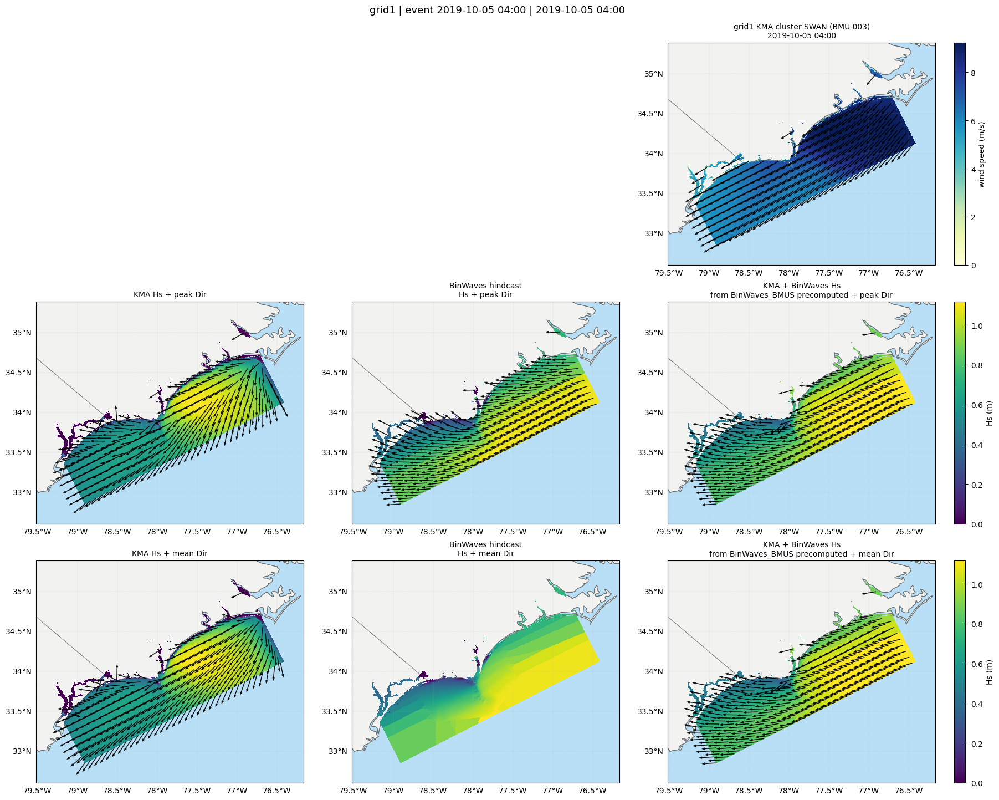

In [10]:
# Spatial SWAN grid maps: GRID KMA cluster SWAN vs BinWaves / combined Hs
from pathlib import Path
import sys

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.animation as animation
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.io import loadmat
from scipy.interpolate import griddata

import xarray as xr

import importlib

_GRID = GRID_DIR if "GRID_DIR" in globals() else Path(".").resolve()
_WIND_MM_UTILS = _GRID.parent / "utils"
if str(_WIND_MM_UTILS) not in sys.path:
    sys.path.insert(0, str(_WIND_MM_UTILS))

import wind_to_bathy_grid
importlib.reload(wind_to_bathy_grid)
from wind_to_bathy_grid import NC_CROP_POLYGON

CGRID_POLY_LON = NC_CROP_POLYGON[:, 0]
CGRID_POLY_LAT = NC_CROP_POLYGON[:, 1]

GRID = GRID_DIR if "GRID_DIR" in globals() else Path(".").resolve()
CLUSTER_CASES_ROOT = GRID / "inputs/CASES_ONLY_WIND"
KMA_BMU_CSV = GRID / "outputs/KMA/nearest_centroids_idxs_kma_pcs.csv"
FIG_OUT = GRID / "outputs/Figures"
FIG_OUT.mkdir(parents=True, exist_ok=True)
SHORESHOP_HS_NC = GRID.parents[1] / "01_BinWaves" / "outputs" / "cropped_variables" / "hs_grid1_masked.nc"
SHORESHOP_DP_NC = GRID.parents[1] / "01_BinWaves" / "outputs" / "cropped_variables" / "dp_grid1_masked.nc"
SHORESHOP_DM_NC = GRID.parents[1] / "01_BinWaves" / "outputs" / "cropped_variables" / "dm_grid1_masked.nc"
BINWAVES_BMUS_ROOT = GRID / "outputs/BinWaves_BMUS"
BINWAVES_BMUS_HS_NC = BINWAVES_BMUS_ROOT / "hs_grid1_BinWaves_BMUS.nc"
BINWAVES_BMUS_DP_NC = BINWAVES_BMUS_ROOT / "dp_grid1_BinWaves_BMUS.nc"
BINWAVES_BMUS_DM_NC = BINWAVES_BMUS_ROOT / "dm_grid1_BinWaves_BMUS.nc"

MAT_NAMES = ("output.mat", "outputs.mat")

# --- user controls ---
EVENT_TIME = "2019-10-05 04:00"  # spatial map hour (single timestep only)
USE_COMPUTED_BINWAVES_BMUS = True  # read merged hs/dp/dm from outputs/BinWaves_BMUS
MAKE_VIDEO = False
VIDEO_STEP_HOURS = 3
VIDEO_FPS = 2
# Arrow density: every Nth grid point (higher = fewer/sparser arrows)
WIND_ARROW_SKIP = 20 # wind panels — try 5 (dense), 10, 15, 20 (sparse)
WAVE_ARROW_SKIP = 20  # Hs direction arrows — same scale
MAP_PAD = 0.25
KMA_LABEL = "grid1 KMA cluster SWAN"
COMBINED_HS_LABEL = "KMA + BinWaves Hs"
BINWAVES_LABEL = "BinWaves hindcast"
WIND_CMAP = "YlGnBu"
HS_CMAP = "viridis"
MAP_OCEAN_COLOR = "#B8DFF5"
MAP_LAND_COLOR = "#F2F2F0"
ARROW_COLOR = "black"
# Fixed-length direction arrows (magnitude shown by pcolormesh only)
DIR_ARROW_STYLE = dict(color=ARROW_COLOR, scale=18, width=0.003, headwidth=3, headlength=4)
WIND_ARROW_STYLE = DIR_ARROW_STYLE
WAVE_ARROW_STYLE = DIR_ARROW_STYLE



def find_cluster_mat(cluster_root, cluster_id):
    case_dir = Path(cluster_root) / f"{int(cluster_id):03d}"
    for name in MAT_NAMES:
        mat_path = case_dir / name
        if mat_path.is_file():
            return mat_path
    return None


def load_bmu_assignments(csv_path):
    bmu = pd.read_csv(csv_path, index_col=0, parse_dates=True).sort_index()
    return bmu["kma_bmus"].astype(int)


def bmu_for_hourly_times(bmu_series, case_times):
    out = bmu_series.reindex(pd.DatetimeIndex(case_times), method="nearest")
    if out.isna().any():
        raise ValueError(
            f"No KMA BMU assignment near {list(pd.DatetimeIndex(case_times))}. "
            f"CSV range: {bmu_series.index.min()} -> {bmu_series.index.max()}"
        )
    return out.astype(int)


def wave_dir_from_to_uv(dir_deg):
    """SWAN/NDBC direction FROM (deg CW from N) -> quiver u,v along propagation TOWARD."""
    rad = np.deg2rad(np.asarray(dir_deg, dtype=float))
    return -np.sin(rad), -np.cos(rad)


def _mat_field(data, key):
    if key not in data:
        return None
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", RuntimeWarning)
        return np.asarray(data[key], dtype=np.float64)


def load_swan_grid(mat_path):
    data = loadmat(mat_path, squeeze_me=True)
    lon = _mat_field(data, "Xp")
    lat = _mat_field(data, "Yp")
    ux = _mat_field(data, "Windv_x")
    vy = _mat_field(data, "Windv_y")
    wind_spd = np.hypot(ux, vy) if ux is not None and vy is not None else None
    hs = _mat_field(data, "Hsig")
    depth = _mat_field(data, "Depth")
    mean_dir = _mat_field(data, "Dir")
    peak_dir = _mat_field(data, "PkDir")
    wave_u = wave_v = None
    if peak_dir is not None:
        wave_u, wave_v = wave_dir_from_to_uv(peak_dir)
    elif mean_dir is not None:
        wave_u, wave_v = wave_dir_from_to_uv(mean_dir)
    return {
        "lon": lon, "lat": lat,
        "wind_u": ux, "wind_v": vy, "wind_spd": wind_spd,
        "hs": hs, "depth": depth, "mean_dir": mean_dir, "peak_dir": peak_dir,
        "wave_u": wave_u, "wave_v": wave_v,
    }



_shoreshop_lonlat_cache = None
_binwaves_bmus_lonlat_cache = None


def _shoreshop_site_lonlat():
    global _shoreshop_lonlat_cache
    if _shoreshop_lonlat_cache is None:
        with xr.open_dataset(SHORESHOP_HS_NC) as ds:
            _shoreshop_lonlat_cache = (
                np.asarray(ds["lon"].values, dtype=float),
                np.asarray(ds["lat"].values, dtype=float),
            )
    return _shoreshop_lonlat_cache


def load_shoreshop_bulk(ts):
    ts = pd.Timestamp(ts).floor("h")
    with xr.open_dataset(SHORESHOP_HS_NC) as ds_hs, \
         xr.open_dataset(SHORESHOP_DP_NC) as ds_dp, \
         xr.open_dataset(SHORESHOP_DM_NC) as ds_dm:
        hs = ds_hs["hs"].sel(time=ts, method="nearest")
        dp = ds_dp["dp"].sel(time=ts, method="nearest")
        dm = ds_dm["dm"].sel(time=ts, method="nearest")
        used = pd.Timestamp(hs.time.values).floor("h")
        if used != ts:
            print(f"ShoreShop nearest time {used} for requested {ts}")
        lon_s, lat_s = _shoreshop_site_lonlat()
        return (
            np.asarray(hs.values, dtype=float),
            np.asarray(dp.values, dtype=float),
            np.asarray(dm.values, dtype=float),
            lon_s,
            lat_s,
        )


def load_shoreshop_hs_dp(ts):
    hs, dp, _dm, lon_s, lat_s = load_shoreshop_bulk(ts)
    return hs, dp, lon_s, lat_s


def _binwaves_bmus_site_lonlat():
    global _binwaves_bmus_lonlat_cache
    if _binwaves_bmus_lonlat_cache is None:
        with xr.open_dataset(BINWAVES_BMUS_HS_NC) as ds:
            _binwaves_bmus_lonlat_cache = (
                np.asarray(ds["lon"].values, dtype=float),
                np.asarray(ds["lat"].values, dtype=float),
            )
    return _binwaves_bmus_lonlat_cache


def load_binwaves_bmus_bulk(ts):
    """Precomputed BinWaves+BMUS bulk fields at ShoreShop sites."""
    ts = pd.Timestamp(ts).floor("h")
    with xr.open_dataset(BINWAVES_BMUS_HS_NC) as ds_hs, \
         xr.open_dataset(BINWAVES_BMUS_DP_NC) as ds_dp, \
         xr.open_dataset(BINWAVES_BMUS_DM_NC) as ds_dm:
        hs = ds_hs["hs"].sel(time=ts, method="nearest")
        dp = ds_dp["dp"].sel(time=ts, method="nearest")
        dm = ds_dm["dm"].sel(time=ts, method="nearest")
        used = pd.Timestamp(hs.time.values).floor("h")
        if used != ts:
            print(f"BinWaves_BMUS nearest time {used} for requested {ts}")
        lon_s, lat_s = _binwaves_bmus_site_lonlat()
        return (
            np.asarray(hs.values, dtype=float),
            np.asarray(dp.values, dtype=float),
            np.asarray(dm.values, dtype=float),
            lon_s,
            lat_s,
        )


def interpolate_sites_to_grid(lon_s, lat_s, values, lon2d, lat2d):
    points = np.column_stack([lon_s, lat_s])
    values = np.asarray(values, dtype=float)
    valid = np.isfinite(values) & np.isfinite(lon_s) & np.isfinite(lat_s)
    if not np.any(valid):
        return np.full(lon2d.shape, np.nan, dtype=float)
    grid = griddata(points[valid], values[valid], (lon2d, lat2d), method="linear", fill_value=np.nan)
    if np.any(~np.isfinite(grid)):
        nearest = griddata(points[valid], values[valid], (lon2d, lat2d), method="nearest")
        grid = np.where(np.isfinite(grid), grid, nearest)
    return grid


def combine_wind_sea_swell_hs(hs_w, hs_s, dp_w, dp_s):
    """Hs = sqrt(hs_w^2 + hs_s^2); direction from higher-energy component."""
    hs_w = np.asarray(hs_w, dtype=float)
    hs_s = np.asarray(hs_s, dtype=float)
    dp_w = np.asarray(dp_w, dtype=float)
    dp_s = np.asarray(dp_s, dtype=float)

    e_w = hs_w ** 2
    e_s = hs_s ** 2
    combined_hs = np.sqrt(np.nansum(np.stack([e_w, e_s]), axis=0))
    active = (np.isfinite(e_w) & (e_w > 0)) | (np.isfinite(e_s) & (e_s > 0))
    combined_hs = np.where(active, combined_hs, np.nan)

    wind_wins = (e_w >= e_s) & active
    combined_dir = np.full(hs_w.shape, np.nan, dtype=float)
    combined_dir[wind_wins] = dp_w[wind_wins]
    combined_dir[~wind_wins & active] = dp_s[~wind_wins & active]

    return combined_hs, *wave_dir_from_to_uv(combined_dir)


def kma_wave_uv(kma, dir_kind="peak"):
    if kma is None:
        return None, None
    if dir_kind == "mean":
        dir_grid = kma.get("mean_dir")
    else:
        dir_grid = kma.get("peak_dir")
        if dir_grid is None:
            dir_grid = kma.get("mean_dir")
    if dir_grid is None:
        return None, None
    return wave_dir_from_to_uv(dir_grid)


def nearest_swan_indices_for_sites(lon_s, lat_s, lon2d, lat2d):
    """For each ShoreShop site, index of nearest SWAN grid node (no interpolation)."""
    n = len(lon_s)
    iy = np.empty(n, dtype=int)
    ix = np.empty(n, dtype=int)
    for s in range(n):
        d2 = (lon2d - lon_s[s]) ** 2 + (lat2d - lat_s[s]) ** 2
        flat = int(np.nanargmin(d2))
        iy[s], ix[s] = np.unravel_index(flat, d2.shape)
    return iy, ix



def build_combined_from_computed_binwaves_bmus_grid(lon2d, lat2d, ts, *, dir_kind="peak"):
    """Interpolate precomputed BinWaves+BMUS bulk fields onto the BMU SWAN grid."""
    try:
        hs_s, dp_s, dm_s, lon_s, lat_s = _binwaves_bmus_bulk_cached(ts)
    except FileNotFoundError as exc:
        print(f"Warning: BinWaves_BMUS bulk missing for {ts}: {exc}")
        return None
    dir_s = dm_s if dir_kind == "mean" else dp_s
    hs_2d = interpolate_sites_to_grid(lon_s, lat_s, hs_s, lon2d, lat2d)
    dir_2d = interpolate_sites_to_grid(lon_s, lat_s, dir_s, lon2d, lat2d)
    wave_u, wave_v = wave_dir_from_to_uv(dir_2d)
    return {"hs": hs_2d, "wave_u": wave_u, "wave_v": wave_v}


_binwaves_bmus_checked = False


def build_combined_grid(kma, lon2d, lat2d, ts, *, dir_kind="peak"):
    global _binwaves_bmus_checked
    if USE_COMPUTED_BINWAVES_BMUS:
        if not _binwaves_bmus_checked:
            for req in (BINWAVES_BMUS_HS_NC, BINWAVES_BMUS_DP_NC, BINWAVES_BMUS_DM_NC):
                if not req.is_file():
                    raise FileNotFoundError(
                        f"Missing computed BinWaves_BMUS file: {req}. "
                        "Run utils/build_kma_merged_grids first."
                    )
            _binwaves_bmus_checked = True
        return build_combined_from_computed_binwaves_bmus_grid(
            lon2d, lat2d, ts, dir_kind=dir_kind
        )
    return build_combined_kma_shoreshop_grid(kma, lon2d, lat2d, ts, dir_kind=dir_kind)


def build_combined_kma_shoreshop_grid(kma, lon2d, lat2d, ts, *, dir_kind="peak"):
    """Interpolate ShoreShop GRID hs/dir onto BMU SWAN grid, then combine."""
    if kma is None or kma.get("hs") is None:
        return None
    try:
        hs_s, dp_s, dm_s, lon_s, lat_s = _shoreshop_bulk_cached(ts)
    except FileNotFoundError as exc:
        print(f"Warning: ShoreShop bulk missing for {ts}: {exc}")
        return None

    if dir_kind == "mean":
        dp_w = kma.get("mean_dir")
        dp_s = dm_s
    else:
        dp_w = kma.get("peak_dir")
        if dp_w is None:
            dp_w = kma.get("mean_dir")
        dp_s = dp_s

    hs_s_2d = interpolate_sites_to_grid(lon_s, lat_s, hs_s, lon2d, lat2d)
    dp_s_2d = interpolate_sites_to_grid(lon_s, lat_s, dp_s, lon2d, lat2d)
    if dp_w is None:
        return None
    hs_c, wave_u, wave_v = combine_wind_sea_swell_hs(kma["hs"], hs_s_2d, dp_w, dp_s_2d)
    return {"hs": hs_c, "wave_u": wave_u, "wave_v": wave_v}


def build_binwaves_grid(lon2d, lat2d, ts, *, dir_kind="peak"):
    """Interpolate ShoreShop/BinWaves hs/dir onto SWAN grid."""
    try:
        hs_s, dp_s, dm_s, lon_s, lat_s = _shoreshop_bulk_cached(ts)
    except FileNotFoundError as exc:
        print(f"Warning: BinWaves bulk missing for {ts}: {exc}")
        return None

    dir_s = dm_s if dir_kind == "mean" else dp_s
    hs_2d = interpolate_sites_to_grid(lon_s, lat_s, hs_s, lon2d, lat2d)
    dir_2d = interpolate_sites_to_grid(lon_s, lat_s, dir_s, lon2d, lat2d)
    wave_u, wave_v = wave_dir_from_to_uv(dir_2d)
    return {"hs": hs_2d, "wave_u": wave_u, "wave_v": wave_v}


def build_combined_at_shoreshop_sites(kma, lon2d, lat2d, ts):
    """Pair each ShoreShop site with nearest BMU SWAN node; combine Hs at sites only (QC)."""
    if kma is None or kma.get("hs") is None:
        return None
    try:
        hs_s, dp_s, lon_s, lat_s = load_shoreshop_hs_dp(ts)
    except FileNotFoundError as exc:
        print(f"Warning: ShoreShop bulk missing for {ts}: {exc}")
        return None

    dp_w_grid = kma.get("peak_dir")
    if dp_w_grid is None:
        dp_w_grid = kma.get("mean_dir")
    if dp_w_grid is None:
        return None

    iy, ix = nearest_swan_indices_for_sites(lon_s, lat_s, lon2d, lat2d)
    hs_w = kma["hs"][iy, ix]
    dp_w = dp_w_grid[iy, ix]

    hs_c, wave_u, wave_v = combine_wind_sea_swell_hs(hs_w, hs_s, dp_w, dp_s)
    ocean = np.isfinite(hs_s) & np.isfinite(hs_c)
    return {
        "lon": lon_s,
        "lat": lat_s,
        "hs": hs_c,
        "hs_s": hs_s,
        "hs_w": hs_w,
        "wave_u": wave_u,
        "wave_v": wave_v,
        "ocean_mask": ocean,
    }


def plot_site_hs_panel(
    ax, sites, *, title, cmap, vmax=None, skip=WAVE_ARROW_SKIP, arrow_style=DIR_ARROW_STYLE,
):
    """Scatter Hs + direction arrows at ShoreShop sites (no SWAN-grid interpolation)."""
    if sites is None:
        ax.set_title(f"{title}\n(no data)", fontsize=10)
        return None

    lon = np.asarray(sites["lon"], dtype=float)
    lat = np.asarray(sites["lat"], dtype=float)
    hs = np.asarray(sites["hs"], dtype=float)
    u = np.asarray(sites["wave_u"], dtype=float)
    v = np.asarray(sites["wave_v"], dtype=float)
    mask = sites.get("ocean_mask")
    if mask is None:
        mask = np.isfinite(hs)
    else:
        mask = np.asarray(mask, dtype=bool)

    add_map_extent(ax, lon, lat, active_mask=mask)
    vmax = _finite_vmax(hs[mask]) if vmax is None else vmax
    norm = plt.Normalize(vmin=0, vmax=vmax)

    sc = ax.scatter(
        lon[mask], lat[mask], c=hs[mask], cmap=cmap, norm=norm,
        s=20, linewidths=0, transform=ccrs.PlateCarree(), zorder=2,
    )

    arrow_style = arrow_style or DIR_ARROW_STYLE
    sl = slice(None, None, skip)
    qmask = mask[sl]
    u_q = u[sl][qmask]
    v_q = v[sl][qmask]
    mag_q = np.hypot(u_q, v_q)
    ok = mag_q > 1e-8
    u_q = np.where(ok, u_q / mag_q, np.nan)
    v_q = np.where(ok, v_q / mag_q, np.nan)
    quiver_kw = dict(
        transform=ccrs.PlateCarree(),
        scale=arrow_style["scale"],
        width=arrow_style["width"],
        color=arrow_style.get("color", ARROW_COLOR),
        alpha=0.95,
        zorder=5,
    )
    for key in ("headwidth", "headlength", "headaxislength", "minshaft"):
        if key in arrow_style:
            quiver_kw[key] = arrow_style[key]
    ax.quiver(lon[sl][qmask], lat[sl][qmask], u_q, v_q, **quiver_kw)
    ax.set_title(title, fontsize=10)
    return sc


def kma_active_mask(wind_spd, min_speed=0.01):
    return np.isfinite(wind_spd) & (wind_spd > min_speed)


def ocean_active_mask(fields, *, min_depth=0.0):
    if fields is None:
        return None
    depth = fields.get("depth")
    if depth is not None:
        return np.isfinite(depth) & (depth > min_depth)
    wind_spd = fields.get("wind_spd")
    if wind_spd is not None:
        return kma_active_mask(wind_spd)
    return None


def wind_display_mask(fields, *, min_speed=0.01):
    ocean = ocean_active_mask(fields)
    if ocean is None:
        return None
    spd = fields.get("wind_spd")
    if spd is None:
        return ocean
    return ocean & kma_active_mask(spd, min_speed=min_speed)


def add_map_extent(ax, lon2d, lat2d, pad=MAP_PAD, active_mask=None):
    if active_mask is not None and np.any(active_mask):
        lon_use = lon2d[active_mask]
        lat_use = lat2d[active_mask]
    else:
        lon_use = lon2d
        lat_use = lat2d
    valid = np.isfinite(lon_use) & np.isfinite(lat_use)
    if not np.any(valid):
        return
    lon_min, lon_max = float(np.nanmin(lon_use[valid])), float(np.nanmax(lon_use[valid]))
    lat_min, lat_max = float(np.nanmin(lat_use[valid])), float(np.nanmax(lat_use[valid]))
    ax.set_extent(
        [lon_min - pad, lon_max + pad, lat_min - pad, lat_max + pad],
        crs=ccrs.PlateCarree(),
    )
    ax.set_facecolor(MAP_OCEAN_COLOR)
    ax.add_feature(cfeature.LAND.with_scale("10m"), facecolor=MAP_LAND_COLOR, edgecolor="none", zorder=0)
    ax.add_feature(cfeature.COASTLINE.with_scale("10m"), linewidth=0.8, edgecolor="0.35", zorder=1)
    ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor="0.45", linewidth=0.5, zorder=1)
    ax.plot(CGRID_POLY_LON, CGRID_POLY_LAT, "k-", lw=1.5, transform=ccrs.PlateCarree(), zorder=4)
    gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0.5, linestyle="--")
    gl.top_labels = False
    gl.right_labels = False


def _finite_vmax(*arrays, default=1.0):
    vals = [np.nanmax(a) for a in arrays if a is not None]
    vals = [v for v in vals if np.isfinite(v)]
    return float(max(vals)) if vals else default


def plot_scalar_vectors(
    ax, lon2d, lat2d, magnitude, u_vec, v_vec, *,
    title, cmap, vmin=0.0, vmax=None,
    skip=WIND_ARROW_SKIP, active_mask=None, arrow_style=None,
    color_arrows_by_magnitude=False,
    show_scalar_field=True,
    normalize_arrows=False,
):
    plot_mask = active_mask
    if plot_mask is None and magnitude is not None:
        plot_mask = np.isfinite(magnitude)
    add_map_extent(ax, lon2d, lat2d, active_mask=plot_mask)
    if magnitude is None or u_vec is None or v_vec is None:
        ax.set_title(f"{title}\n(no data)", fontsize=10)
        return None

    if plot_mask is not None:
        magnitude = np.where(plot_mask, magnitude, np.nan)
        u_vec = np.where(plot_mask, u_vec, np.nan)
        v_vec = np.where(plot_mask, v_vec, np.nan)

    vmax = _finite_vmax(magnitude) if vmax is None else vmax
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    cmap_obj = plt.get_cmap(cmap)

    pm = None
    if show_scalar_field:
        pm = ax.pcolormesh(
            lon2d, lat2d, magnitude,
            transform=ccrs.PlateCarree(), cmap=cmap, norm=norm,
            shading="auto", zorder=1,
        )

    arrow_style = arrow_style or WIND_ARROW_STYLE
    sl = (slice(None, None, skip), slice(None, None, skip))
    qmask = plot_mask[sl] if plot_mask is not None else np.isfinite(magnitude[sl])
    lon_q = lon2d[sl][qmask]
    lat_q = lat2d[sl][qmask]
    u_q = u_vec[sl][qmask]
    v_q = v_vec[sl][qmask]
    if normalize_arrows:
        mag_q = np.hypot(u_q, v_q)
        ok = mag_q > 1e-8
        u_q = np.where(ok, u_q / mag_q, np.nan)
        v_q = np.where(ok, v_q / mag_q, np.nan)
    if color_arrows_by_magnitude:
        spd_q = magnitude[sl][qmask]
        arrow_colors = cmap_obj(norm(spd_q))
    else:
        arrow_colors = arrow_style.get("color", ARROW_COLOR)

    quiver_kw = dict(
        transform=ccrs.PlateCarree(),
        scale=arrow_style["scale"],
        width=arrow_style["width"],
        color=arrow_colors,
        alpha=0.95,
        zorder=5,
    )
    for key in ("headwidth", "headlength", "headaxislength", "minshaft"):
        if key in arrow_style:
            quiver_kw[key] = arrow_style[key]
    ax.quiver(lon_q, lat_q, u_q, v_q, **quiver_kw)

    if pm is None:
        pm = plt.cm.ScalarMappable(norm=norm, cmap=cmap_obj)
        pm.set_array([])

    ax.set_title(title, fontsize=10)
    return pm


def snapshot_context():
    """BMU assignment for the single map hour (EVENT_TIME)."""
    if "EVENT_TIME" not in globals():
        raise NameError("Set EVENT_TIME in this cell (user controls).")
    ts = pd.Timestamp(EVENT_TIME).floor("h")
    bmu_by_time = None
    if KMA_BMU_CSV.is_file():
        bmu_series = load_bmu_assignments(KMA_BMU_CSV)
        bmu_by_time = bmu_for_hourly_times(bmu_series, pd.DatetimeIndex([ts]))
    return ts, bmu_by_time


def period_context():
    """Video/QC time range: uses t_start/t_end from comparison cell (cell 27)."""
    if "t_start" not in globals() or "t_end" not in globals():
        raise NameError("Run the comparison cell (cell 27) first to set t_start/t_end.")
    t0 = pd.Timestamp(t_start).floor("h")
    t1 = pd.Timestamp(t_end).floor("h")
    case_times = pd.date_range(t0, t1, freq="h")
    if len(case_times) == 0:
        raise ValueError(f"No hourly times between {t_start} and {t_end}")
    bmu_by_time = None
    if KMA_BMU_CSV.is_file():
        bmu_series = load_bmu_assignments(KMA_BMU_CSV)
        bmu_by_time = bmu_for_hourly_times(bmu_series.loc[t0:t1], case_times)
    return case_times, bmu_by_time


_cluster_grid_cache = {}
_shoreshop_bulk_cache = {}
_binwaves_bmus_bulk_cache = {}


def fields_at_time(cluster_root, bmu_by_time, ts):
    kma = None
    bmu = None
    if bmu_by_time is not None and ts in bmu_by_time.index:
        bmu = int(bmu_by_time.loc[ts])
        if bmu not in _cluster_grid_cache:
            kma_mat = find_cluster_mat(cluster_root, bmu)
            if kma_mat is not None:
                _cluster_grid_cache[bmu] = load_swan_grid(kma_mat)
            else:
                print(f"Warning: no cluster output.mat for BMU {bmu:03d} under {cluster_root}")
                _cluster_grid_cache[bmu] = None
        kma = _cluster_grid_cache.get(bmu)

    if kma is None:
        raise FileNotFoundError(f"No KMA cluster SWAN mat for {ts}")
    return kma["lon"], kma["lat"], kma, bmu


def _shoreshop_bulk_cached(ts):
    ts = pd.Timestamp(ts).floor("h")
    if ts not in _shoreshop_bulk_cache:
        _shoreshop_bulk_cache[ts] = load_shoreshop_bulk(ts)
    return _shoreshop_bulk_cache[ts]


def _binwaves_bmus_bulk_cached(ts):
    ts = pd.Timestamp(ts).floor("h")
    if ts not in _binwaves_bmus_bulk_cache:
        _binwaves_bmus_bulk_cache[ts] = load_binwaves_bmus_bulk(ts)
    return _binwaves_bmus_bulk_cache[ts]

def combined_hs_panel_title(dir_label):
    if USE_COMPUTED_BINWAVES_BMUS:
        return f"{COMBINED_HS_LABEL}\nfrom BinWaves_BMUS precomputed + {dir_label}"
    return f"{COMBINED_HS_LABEL}\n$H_s=\\sqrt{{H_{{s,KMA}}^2+H_{{s,BinWaves}}^2}}$ + {dir_label}"


def plot_wave_hs_row(
    axes, lon2d, lat2d, kma, binwaves, combined, *, dir_kind, hs_vmax, ocean_mask,
):
    """Plot KMA / BinWaves / combined Hs panels for peak or mean direction."""
    dir_label = "mean Dir" if dir_kind == "mean" else "peak Dir"
    kma_u, kma_v = kma_wave_uv(kma, dir_kind)
    pm_h0 = plot_scalar_vectors(
        axes[0], lon2d, lat2d,
        kma["hs"], kma_u, kma_v,
        title=f"KMA Hs + {dir_label}", cmap=HS_CMAP, vmax=hs_vmax,
        active_mask=ocean_mask, skip=WAVE_ARROW_SKIP, arrow_style=DIR_ARROW_STYLE,
    )
    plot_scalar_vectors(
        axes[1], lon2d, lat2d,
        binwaves["hs"] if binwaves else None,
        binwaves["wave_u"] if binwaves else None,
        binwaves["wave_v"] if binwaves else None,
        title=f"{BINWAVES_LABEL}\nHs + {dir_label}",
        cmap=HS_CMAP, vmax=hs_vmax,
        active_mask=ocean_mask, skip=WAVE_ARROW_SKIP, arrow_style=DIR_ARROW_STYLE,
    )
    plot_scalar_vectors(
        axes[2], lon2d, lat2d,
        combined["hs"] if combined else None,
        combined["wave_u"] if combined else None,
        combined["wave_v"] if combined else None,
        title=combined_hs_panel_title(dir_label),
        cmap=HS_CMAP, vmax=hs_vmax,
        active_mask=ocean_mask, skip=WAVE_ARROW_SKIP, arrow_style=DIR_ARROW_STYLE,
    )
    return pm_h0



def prepare_panel_data(ts, bmu_by_time):
  """Load/cache all fields needed for one spatial map."""
  ts = pd.Timestamp(ts).floor("h")
  lon2d, lat2d, kma, bmu = fields_at_time(CLUSTER_CASES_ROOT, bmu_by_time, ts)
  ocean_mask = ocean_active_mask(kma)
  kma_wind_mask = wind_display_mask(kma)
  combined_peak = build_combined_grid(kma, lon2d, lat2d, ts, dir_kind="peak")
  combined_mean = build_combined_grid(kma, lon2d, lat2d, ts, dir_kind="mean")
  binwaves_peak = build_binwaves_grid(lon2d, lat2d, ts, dir_kind="peak")
  binwaves_mean = build_binwaves_grid(lon2d, lat2d, ts, dir_kind="mean")
  return {
      "ts": ts,
      "lon2d": lon2d,
      "lat2d": lat2d,
      "kma": kma,
      "bmu": bmu,
      "ocean_mask": ocean_mask,
      "kma_wind_mask": kma_wind_mask,
      "combined_peak": combined_peak,
      "combined_mean": combined_mean,
      "binwaves_peak": binwaves_peak,
      "binwaves_mean": binwaves_mean,
  }


def period_map_limits(panels):
    wind_max = hs_max = 0.0
    for panel in panels:
        kma = panel["kma"]
        ocean_mask = panel["ocean_mask"]
        kma_wind_mask = panel["kma_wind_mask"]
        wind_max = max(wind_max, _finite_vmax(
            kma["wind_spd"][kma_wind_mask] if kma_wind_mask is not None else kma["wind_spd"],
            default=0,
        ))
        hs_max = max(hs_max, _finite_vmax(
            kma["hs"][ocean_mask] if ocean_mask is not None else kma["hs"],
            default=0,
        ))
        for key in ("combined_peak", "combined_mean", "binwaves_peak", "binwaves_mean"):
            p = panel.get(key)
            hs_max = max(hs_max, _finite_vmax(
                p["hs"][ocean_mask] if p is not None and ocean_mask is not None else None,
                default=0,
            ))
    return wind_max, hs_max


def draw_spatial_panel(panel, *, wind_vmax=None, hs_vmax=None, show=True, save_path=None):
    ts = panel["ts"]
    lon2d = panel["lon2d"]
    lat2d = panel["lat2d"]
    kma = panel["kma"]
    bmu = panel["bmu"]
    ocean_mask = panel["ocean_mask"]
    kma_wind_mask = panel["kma_wind_mask"]
    combined_peak = panel["combined_peak"]
    combined_mean = panel["combined_mean"]
    binwaves_peak = panel["binwaves_peak"]
    binwaves_mean = panel["binwaves_mean"]

    fig = plt.figure(figsize=(18, 14), constrained_layout=True)
    gs = fig.add_gridspec(3, 3)
    ax_wind = fig.add_subplot(gs[0, :], projection=ccrs.PlateCarree())
    axes_peak = [fig.add_subplot(gs[1, i], projection=ccrs.PlateCarree()) for i in range(3)]
    axes_mean = [fig.add_subplot(gs[2, i], projection=ccrs.PlateCarree()) for i in range(3)]

    bmu_txt = f"BMU {bmu:03d}" if bmu is not None else "BMU n/a"
    pm_w0 = plot_scalar_vectors(
        ax_wind, lon2d, lat2d,
        kma["wind_spd"], kma["wind_u"], kma["wind_v"],
        title=f"{KMA_LABEL} ({bmu_txt})\n{ts:%Y-%m-%d %H:%M}",
        cmap=WIND_CMAP, vmax=wind_vmax, active_mask=kma_wind_mask,
        skip=WIND_ARROW_SKIP,
        normalize_arrows=True,
        arrow_style=DIR_ARROW_STYLE,
    )
    pm_h_peak = plot_wave_hs_row(
        axes_peak, lon2d, lat2d, kma, binwaves_peak, combined_peak,
        dir_kind="peak", hs_vmax=hs_vmax, ocean_mask=ocean_mask,
    )
    pm_h_mean = plot_wave_hs_row(
        axes_mean, lon2d, lat2d, kma, binwaves_mean, combined_mean,
        dir_kind="mean", hs_vmax=hs_vmax, ocean_mask=ocean_mask,
    )

    fig.suptitle(f"grid1 | event {EVENT_TIME} | {ts:%Y-%m-%d %H:%M}", fontsize=13, y=1.02)

    if save_path is not None:
        fig.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"Saved {save_path}")
    if show:
        plt.show()
    else:
        plt.close(fig)


def build_period_video(step_hours=VIDEO_STEP_HOURS, fps=VIDEO_FPS):
    case_times, bmu_by_time = period_context()
    video_times = case_times[:: max(1, int(step_hours))]
    if len(video_times) == 0:
        raise ValueError(f"No times for video in period {t_start} to {t_end}")

    wind_max = hs_max = 0.0
    cache = {}
    for ts in video_times:
        lon2d, lat2d, kma, bmu = fields_at_time(CLUSTER_CASES_ROOT, bmu_by_time, ts)
        ocean_mask = ocean_active_mask(kma)
        kma_wind_mask = wind_display_mask(kma)
        combined_peak = build_combined_grid(kma, lon2d, lat2d, ts, dir_kind="peak")
        combined_mean = build_combined_grid(kma, lon2d, lat2d, ts, dir_kind="mean")
        binwaves_peak = build_binwaves_grid(lon2d, lat2d, ts, dir_kind="peak")
        binwaves_mean = build_binwaves_grid(lon2d, lat2d, ts, dir_kind="mean")
        cache[ts] = (
            lon2d, lat2d, kma, bmu,
            combined_peak, combined_mean, binwaves_peak, binwaves_mean,
            ocean_mask, kma_wind_mask,
        )
        wind_max = max(wind_max, _finite_vmax(
            kma["wind_spd"][kma_wind_mask] if kma_wind_mask is not None else kma["wind_spd"],
            default=0,
        ))
        hs_max = max(hs_max, _finite_vmax(
            kma["hs"][ocean_mask] if ocean_mask is not None else kma["hs"],
            default=0,
        ))
        for panel in (combined_peak, combined_mean, binwaves_peak, binwaves_mean):
            hs_max = max(hs_max, _finite_vmax(
                panel["hs"][ocean_mask] if panel is not None and ocean_mask is not None else None,
                default=0,
            ))

    fig = plt.figure(figsize=(18, 14), constrained_layout=True)
    gs = fig.add_gridspec(3, 3)
    ax_wind = fig.add_subplot(gs[0, :], projection=ccrs.PlateCarree())
    axes_peak = [fig.add_subplot(gs[1, i], projection=ccrs.PlateCarree()) for i in range(3)]
    axes_mean = [fig.add_subplot(gs[2, i], projection=ccrs.PlateCarree()) for i in range(3)]
    frame_axes = [ax_wind, *axes_peak, *axes_mean]

    def _draw_frame(i):
        ts = video_times[i]
        (
            lon2d, lat2d, kma, bmu,
            combined_peak, combined_mean, binwaves_peak, binwaves_mean,
            ocean_mask, kma_wind_mask,
        ) = cache[ts]
        for ax in frame_axes:
            ax.clear()
        bmu_txt = f"BMU {bmu:03d}" if bmu is not None else "BMU n/a"
        pm_w0 = plot_scalar_vectors(
            ax_wind, lon2d, lat2d,
            kma["wind_spd"], kma["wind_u"], kma["wind_v"],
            title=f"{KMA_LABEL} ({bmu_txt})\n{ts:%Y-%m-%d %H:%M}",
            cmap=WIND_CMAP, vmax=wind_max, active_mask=kma_wind_mask,
            skip=WIND_ARROW_SKIP,
            normalize_arrows=True,
            arrow_style=DIR_ARROW_STYLE,
        )
        pm_h_peak = plot_wave_hs_row(
            axes_peak, lon2d, lat2d, kma, binwaves_peak, combined_peak,
            dir_kind="peak", hs_vmax=hs_max, ocean_mask=ocean_mask,
        )
        pm_h_mean = plot_wave_hs_row(
            axes_mean, lon2d, lat2d, kma, binwaves_mean, combined_mean,
            dir_kind="mean", hs_vmax=hs_max, ocean_mask=ocean_mask,
        )
        fig.suptitle(
            f"grid1 | {t_start} to {t_end} | {ts:%Y-%m-%d %H:%M}  ({i + 1}/{len(video_times)})",
            fontsize=13, y=1.02,
        )
        return [a for a in [pm_w0, pm_h_peak, pm_h_mean] if a is not None]

    out_mp4 = FIG_OUT / f"period_wind_hs_maps_{VIDEO_STEP_HOURS}h.mp4"
    out_gif = FIG_OUT / f"period_wind_hs_maps_{VIDEO_STEP_HOURS}h.gif"
    anim = animation.FuncAnimation(fig, _draw_frame, frames=len(video_times), blit=False)
    try:
        writer = animation.FFMpegWriter(fps=fps)
        anim.save(out_mp4, writer=writer, dpi=120)
        print(f"Saved video {out_mp4}")
    except Exception as exc:
        print(f"FFmpeg unavailable ({exc}); saving GIF instead")
        anim.save(out_gif, writer=animation.PillowWriter(fps=fps), dpi=120)
        print(f"Saved video {out_gif}")
    plt.close(fig)
    return anim


def plot_shoreshop_hs_snapshot(ts, *, bmu=41, save_path=None, show=True):
    """QC: ShoreShop grid1 sites + Hs interpolated/combined on BMU SWAN grid."""
    ts = pd.Timestamp(ts).floor("h")
    hs_s, dp_s, lon_s, lat_s = load_shoreshop_hs_dp(ts)

    kma_mat = find_cluster_mat(CLUSTER_CASES_ROOT, bmu)
    kma = load_swan_grid(kma_mat) if kma_mat else None
    lon2d, lat2d = kma["lon"], kma["lat"]
    depth = kma.get("depth")
    wet = np.isfinite(depth) & (depth > 0) if depth is not None else np.isfinite(lon2d)

    hs2d = interpolate_sites_to_grid(lon_s, lat_s, hs_s, lon2d, lat2d)
    combined = build_combined_grid(kma, lon2d, lat2d, ts)
    valid = np.isfinite(hs_s) & np.isfinite(lon_s) & np.isfinite(lat_s)

    extent = [
        float(np.nanmin(lon2d[wet])) - 0.2, float(np.nanmax(lon2d[wet])) + 0.2,
        float(np.nanmin(lat2d[wet])) - 0.2, float(np.nanmax(lat2d[wet])) + 0.2,
    ]
    vmax = float(max(np.nanpercentile(hs_s[valid], 98), np.nanpercentile(hs2d[wet], 98), 0.5))
    if combined is not None:
        vmax = max(vmax, float(np.nanpercentile(combined["hs"][wet], 98)))

    fig, axes = plt.subplots(1, 2, figsize=(13, 5), subplot_kw={"projection": ccrs.PlateCarree()})
    sc = axes[0].scatter(
        lon_s[valid], lat_s[valid], c=hs_s[valid], s=20, cmap=HS_CMAP,
        vmin=0, vmax=vmax, transform=ccrs.PlateCarree(), edgecolors="none",
    )
    axes[0].set_title(f"ShoreShop grid1 sites Hs\n{ts:%Y-%m-%d %H:%M}")
    pm = axes[1].pcolormesh(
        lon2d, lat2d, np.where(wet, combined["hs"] if combined else hs2d, np.nan),
        transform=ccrs.PlateCarree(), cmap=HS_CMAP, vmin=0, vmax=vmax, shading="auto",
    )
    axes[1].set_title(f"Combined on BMU grid\nBMU {bmu:03d}")
    for ax in axes:
        ax.set_extent(extent, crs=ccrs.PlateCarree())
        ax.set_facecolor(MAP_OCEAN_COLOR)
        ax.add_feature(cfeature.LAND.with_scale("10m"), facecolor=MAP_LAND_COLOR, edgecolor="none")
        ax.add_feature(cfeature.COASTLINE.with_scale("10m"), linewidth=0.6)
    fig.suptitle("ShoreShop grid1 → interpolate → combine with BMU", fontsize=12, y=1.02)
    if save_path is not None:
        save_path = Path(save_path)
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"Saved {save_path}")
    if show:
        plt.show()
    else:
        plt.close(fig)
    if combined is not None:
        print(
            f"site ShoreShop max={np.nanmax(hs_s[valid]):.2f} m | "
            f"interp ShoreShop max={np.nanmax(hs2d[wet]):.2f} m | "
            f"BMU max={np.nanmax(kma['hs'][wet]):.2f} m | "
            f"combined max={np.nanmax(combined['hs'][wet]):.2f} m"
        )
    return combined



# Set True to plot ShoreShop Hs only (QC)
SHOW_SHORESHOP_QC = False
if SHOW_SHORESHOP_QC:
    _case_times, _ = period_context()
    _qc_ts = _case_times[len(_case_times) // 2]
    plot_shoreshop_hs_snapshot(
        _qc_ts,
        save_path=FIG_OUT / f"shoreshop_hs_{pd.Timestamp(_qc_ts).strftime('%Y%m%d_%H%M')}.png",
    )

# --- run: single spatial map at EVENT_TIME (1 hour of data only) ---
_cluster_grid_cache.clear()
_shoreshop_bulk_cache.clear()
_binwaves_bmus_bulk_cache.clear()

map_time, bmu_by_time = snapshot_context()
print(f"Spatial map @ {map_time} (1 timestep)")

panel = prepare_panel_data(map_time, bmu_by_time)
snap_path = FIG_OUT / f"wind_hs_{map_time.strftime('%Y%m%d_%H%M')}.png"
draw_spatial_panel(panel, save_path=snap_path, show=True)

if MAKE_VIDEO:
    build_period_video(step_hours=VIDEO_STEP_HOURS, fps=VIDEO_FPS)


## Buoy vs BinWaves+BMUS bulk validation

ShoreShop-style Hs / Tp / Dir scatter panels for each buoy in `buoys_geo` (uses precomputed `outputs/BinWaves_BMUS`).


In [ ]:
# Buoy vs hindcast bulk validation scatter (Hs, Tp, Dir)
import importlib
import sys
from pathlib import Path

if "GRID_DIR" not in globals():
    GRID_DIR = Path(".").resolve()

UTILS_DIR = GRID_DIR / "utils"
if str(UTILS_DIR) not in sys.path:
    sys.path.insert(0, str(UTILS_DIR))

import buoy_comparison as bc
importlib.reload(bc)

if "buoys_geo" not in globals():
    raise NameError("Run the buoys_geo cell above first.")

bc.plot_buoy_bulk_validation_scatter(
    buoy_ids=list(buoys_geo.keys()),
    buoys=buoys_geo,
    hindcast_folder=GRID_DIR / "outputs/BinWaves_BMUS",
    grid_id=1,
    aggregation="hourly",
    use_buoy_time_range=True,
    model_label="BinWaves + BMUS",
    output_folder=GRID_DIR / "outputs/Figures/buoy_validation_binwaves_bmus",
    save=True,
    save_timeseries=True,
    show=False,
)
